In [84]:
pip install minisom

  Preparing metadata (setup.py): started
  Preparing metadata (setup.py): finished with status 'done'
  Created wheel for minisom: filename=MiniSom-2.3.2-py3-none-any.whl size=10663 sha256=0b3dd4ce514147614fd27f51032cfe98d02c4893965fb93fe125518e312b89b1
  Stored in directory: c:\users\alecb\appdata\local\pip\cache\wheels\b4\f6\8a\9daf8831901c3e3805775633404248f10663d1c80b7e5a1314
Successfully built minisom
Note: you may need to restart the kernel to use updated packages.



[notice] A new release of pip is available: 23.2.1 -> 24.0
[notice] To update, run: python.exe -m pip install --upgrade pip


In [85]:
from pathlib import Path, PureWindowsPath
import seaborn as sns
import os
import math
# Essential Libraries
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
# Preprocessing
from sklearn.preprocessing import MinMaxScaler
# Algorithms
from minisom import MiniSom
from tslearn.barycenters import dtw_barycenter_averaging
from tslearn.clustering import TimeSeriesKMeans
from sklearn.cluster import KMeans

from sklearn.decomposition import PCA

C:\Python310\lib\site-packages\tqdm\auto.py:22: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


# Import Data

In [3]:
os.path.dirname(os.getcwd())

'C:\\Users\\alecb\\Projects\\capstone\\Store-Sales'

In [4]:
path_cwd = Path(PureWindowsPath(os.path.dirname(os.getcwd())))
path_cwd

WindowsPath('C:/Users/alecb/Projects/capstone/Store-Sales')

In [5]:
path = path_cwd / 'data'
path

WindowsPath('C:/Users/alecb/Projects/capstone/Store-Sales/data')

In [6]:
path / 'train'

WindowsPath('C:/Users/alecb/Projects/capstone/Store-Sales/data/train')

In [57]:
df_train = pd.read_csv(path / 'train.csv')
df_transaction = pd.read_csv(path / 'transactions.csv')
df_holidays = pd.read_csv(path / 'holidays_events.csv')
df_oil = pd.read_csv(path / 'oil.csv')
df_stores = pd.read_csv(path / 'stores.csv')
df_test = pd.read_csv(path / 'test.csv')

In [22]:
df_train

,id,date,store_nbr,family,sales,onpromotion
0,0,2013-01-01,1,AUTOMOTIVE,0.000,0
1,1,2013-01-01,1,BABY CARE,0.000,0
2,2,2013-01-01,1,BEAUTY,0.000,0
3,3,2013-01-01,1,BEVERAGES,0.000,0
4,4,2013-01-01,1,BOOKS,0.000,0
...,...,...,...,...,...,...
3000883,3000883,2017-08-15,9,POULTRY,438.133,0
3000884,3000884,2017-08-15,9,PREPARED FOODS,154.553,1
3000885,3000885,2017-08-15,9,PRODUCE,2419.729,148
3000886,3000886,2017-08-15,9,SCHOOL AND OFFICE SUPPLIES,121.000,8


In [ ]:
df_

In [31]:
import pandas as pd
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler

# Load your dataframe 'df_train'
# Assuming you have preprocessed your data already

# Aggregating sales for each family
family_sales = df_train.groupby('family')['sales'].sum().reset_index()

# Normalize the sales data
scaler = StandardScaler()
sales_scaled = scaler.fit_transform(family_sales[['sales']])

wcss = []
for i in range(1, 21):
    kmeans = KMeans(n_clusters = i, init = 'k-means++', random_state = 42)
    kmeans.fit(sales_scaled)
    wcss.append(kmeans.inertia_)

C:\Python310\lib\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
C:\Python310\lib\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
C:\Python310\lib\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
C:\Python310\lib\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  s

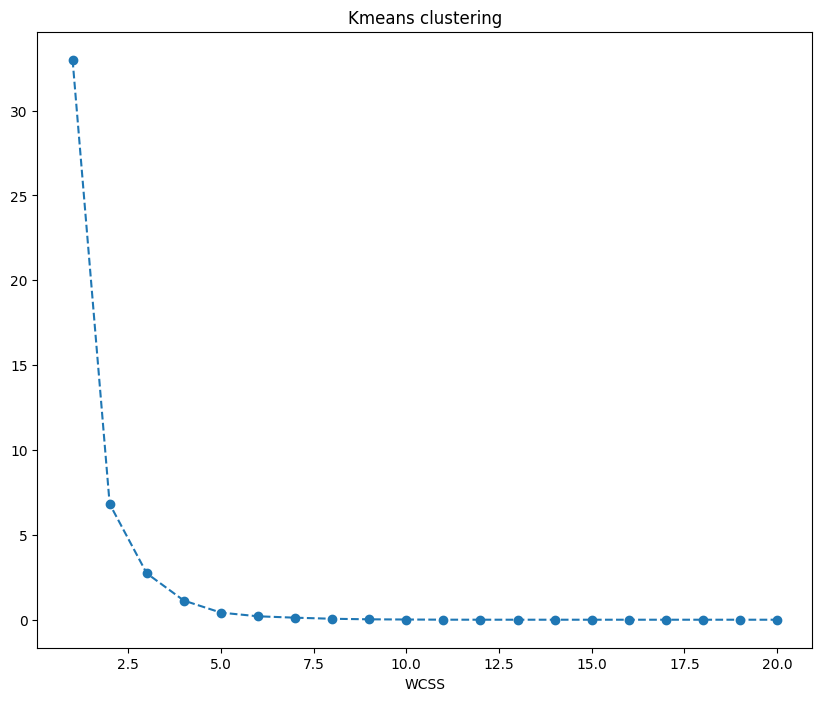

In [32]:
plt.figure(figsize = (10, 8))
plt.plot(range(1, 21), wcss, marker = 'o', linestyle = '--')
plt.xlabel('WCSS')
plt.title('Kmeans clustering')
plt.show()

In [26]:
# Apply K-means clustering
kmeans = KMeans(n_clusters=3, random_state=42)  # Adjust the number of clusters as needed
family_sales['cluster'] = kmeans.fit_predict(sales_scaled)

# Print the cluster centers
print("Cluster Centers:")
print(pd.DataFrame(scaler.inverse_transform(kmeans.cluster_centers_), columns=['sales']))

# Print the families in each cluster
print("\nFamilies in Each Cluster:")
print(family_sales[['family', 'cluster']])

Cluster Centers:
          sales
0  2.802086e+08
1  9.490456e+07
2  8.161216e+06

Families in Each Cluster:
                        family  cluster
0                   AUTOMOTIVE        2
1                    BABY CARE        2
2                       BEAUTY        2
3                    BEVERAGES        0
4                        BOOKS        2
5                 BREAD/BAKERY        2
6                  CELEBRATION        2
7                     CLEANING        1
8                        DAIRY        1
9                         DELI        2
10                        EGGS        2
11                FROZEN FOODS        2
12                   GROCERY I        0
13                  GROCERY II        2
14                    HARDWARE        2
15          HOME AND KITCHEN I        2
16         HOME AND KITCHEN II        2
17             HOME APPLIANCES        2
18                   HOME CARE        2
19                  LADIESWEAR        2
20             LAWN AND GARDEN        2
21          

C:\Python310\lib\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


# Discovery

### Field Descriptions
1. train.csv
* The training data, comprising time series of features store_nbr, family, and onpromotion as well as the target sales.
* store_nbr identifies the store at which the products are sold. (Even amount: 55572 each)
* family identifies the type of product sold. (Even amount: 90,926 each)
* sales gives the total sales for a product family at a particular store at a given date. Fractional values are possible since products can be sold in fractional units (1.5 kg of cheese, for instance, as opposed to 1 bag of chips).
* onpromotion gives the total number of items in a product family that were being promoted at a store at a given date.
2. test.csv
* The test data, having the same features as the training data. You will predict the target sales for the dates in this file.
* The dates in the test data are for the 15 days after the last date in the training data.
3. sample_submission.csv
* A sample submission file in the correct format.
4. stores.csv
* Store metadata, including city, state, type, and cluster.
* cluster is a grouping of similar stores.
5. oil.csv
* Daily oil price. Includes values during both the train and test data timeframes. (Ecuador is an oil-dependent country and it's economical health is highly vulnerable to shocks in oil prices.)
6. holidays_events.csv
* Holidays and Events, with metadata
* NOTE: Pay special attention to the transferred column. A holiday that is transferred officially falls on that calendar day, but was moved to another date by the government. A transferred day is more like a normal day than a holiday. To find the day that it was actually celebrated, look for the corresponding row where type is Transfer. For example, the holiday Independencia de Guayaquil was transferred from 2012-10-09 to 2012-10-12, which means it was celebrated on 2012-10-12. Days that are type Bridge are extra days that are added to a holiday (e.g., to extend the break across a long weekend). These are frequently made up by the type Work Day which is a day not normally scheduled for work (e.g., Saturday) that is meant to payback the Bridge.
Additional holidays are days added a regular calendar holiday, for example, as typically happens around Christmas (making Christmas Eve a holiday).
7. Additional Notes
* Wages in the public sector are paid every two weeks on the 15 th and on the last day of the month. Supermarket sales could be affected by this.
* A magnitude 7.8 earthquake struck Ecuador on April 16, 2016. People rallied in relief efforts donating water and other first need products which greatly affected supermarket sales for several weeks after the earthquake.

### Ideas
* Does oil prices have any indication of store sales? Feature of oil price feed into store sales forecast
* Location of stores should we taken into consideration, and treated seperately

# On Promotion Exploration

In [35]:
df_train['onpromotion'].describe()

count    3.000888e+06
mean     2.602770e+00
std      1.221888e+01
min      0.000000e+00
25%      0.000000e+00
50%      0.000000e+00
75%      0.000000e+00
max      7.410000e+02
Name: onpromotion, dtype: float64

<AxesSubplot: xlabel='Count', ylabel='onpromotion'>

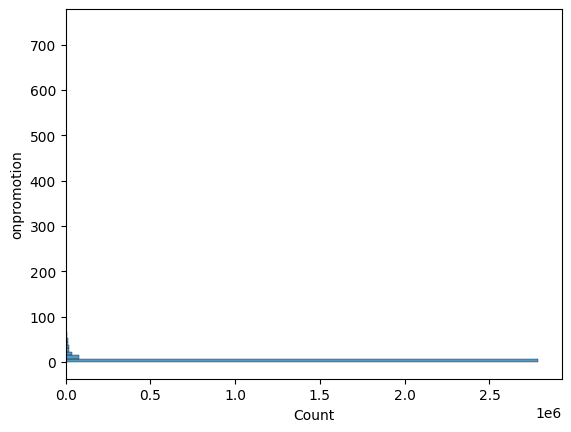

In [38]:
sns.histplot(data = df_train, y='onpromotion', bins = 100)

In [52]:
print(df_train[(df_train['onpromotion'] > 0)]['onpromotion'].count())
print(df_train['onpromotion'].count())

df_train[(df_train['onpromotion'] > 0)]['onpromotion'].count()/df_train['onpromotion'].count()

611329
3000888


0.20371603338745065

<AxesSubplot: xlabel='Count', ylabel='onpromotion'>

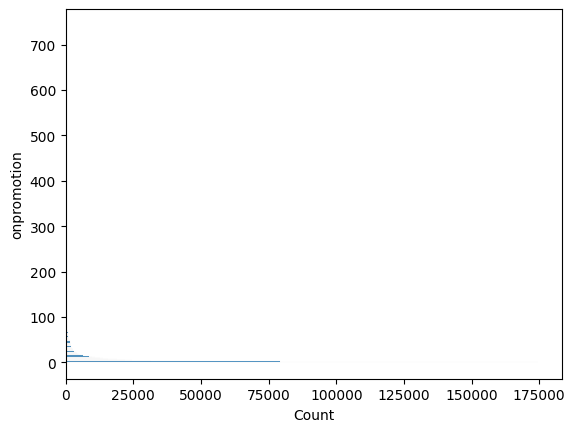

In [55]:
sns.histplot(data=df_train[df_train['onpromotion'] > 0], y='onpromotion')

In [58]:
df_train['promoted'] = df_train['onpromotion'] > 0

# Oil Exploration

In [54]:
df_oil['date'] = pd.to_datetime(df_oil['date'], errors = 'coerce')

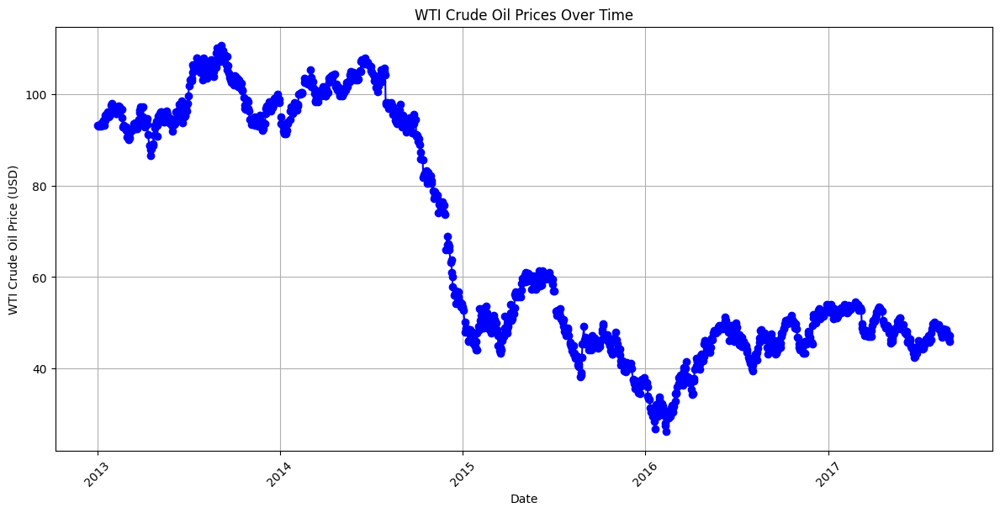

In [57]:
# Set the 'date' column as the index (optional but can be helpful for plotting)
df_oil.set_index('date', inplace=True)

# Sort the DataFrame by date (optional but can be helpful for plotting)
df_oil.sort_index(inplace=True)

# Plotting
plt.figure(figsize=(12, 6))  # Set the figure size
plt.plot(df_oil.index, df_oil['dcoilwtico'], color='blue', marker='o', linestyle='-')  # Plotting the data
plt.title('WTI Crude Oil Prices Over Time')  # Title of the plot
plt.xlabel('Date')  # X-axis label
plt.ylabel('WTI Crude Oil Price (USD)')  # Y-axis label
plt.grid(True)  # Show grid
plt.tight_layout()  # Adjust layout to prevent clipping of labels
plt.xticks(rotation=45)  # Rotate x-axis labels for better readability
plt.show()  # Display the plo

In [9]:
df_daily_sales = df_train.groupby('date')['sales'].sum().reset_index()
df_daily_sales['date'] = pd.to_datetime(df_daily_sales['date'])
#use rolling avg for SARIMA
df_daily_sales['rolling_average_7_day'] = df_daily_sales['sales'].rolling(window=7).mean() 

#Set index to be date
df_daily_sales.set_index('date', inplace=True)
df_daily_sales.sort_index(inplace=True)

In [53]:
family_sales

,date,family,smoth_7
6,2013-01-01,AUTOMOTIVE,0.000000
7,2013-01-01,AUTOMOTIVE,0.000000
8,2013-01-01,AUTOMOTIVE,0.000000
9,2013-01-01,AUTOMOTIVE,0.000000
10,2013-01-01,AUTOMOTIVE,0.000000
...,...,...,...
3000883,2017-08-15,SEAFOOD,21.385858
3000884,2017-08-15,SEAFOOD,20.062000
3000885,2017-08-15,SEAFOOD,25.324571
3000886,2017-08-15,SEAFOOD,26.469714


In [34]:
df_train

,id,date,store_nbr,family,sales,onpromotion
0,0,2013-01-01,1,AUTOMOTIVE,0.000,0
1,1,2013-01-01,1,BABY CARE,0.000,0
2,2,2013-01-01,1,BEAUTY,0.000,0
3,3,2013-01-01,1,BEVERAGES,0.000,0
4,4,2013-01-01,1,BOOKS,0.000,0
...,...,...,...,...,...,...
3000883,3000883,2017-08-15,9,POULTRY,438.133,0
3000884,3000884,2017-08-15,9,PREPARED FOODS,154.553,1
3000885,3000885,2017-08-15,9,PRODUCE,2419.729,148
3000886,3000886,2017-08-15,9,SCHOOL AND OFFICE SUPPLIES,121.000,8


In [33]:
df_daily_sales

,sales,rolling_average_7_day
date,,
2013-01-01,2511.618999,NaN
2013-01-02,496092.417944,NaN
2013-01-03,361461.231124,NaN
2013-01-04,354459.677093,NaN
2013-01-05,477350.121229,NaN
...,...,...
2017-08-11,826373.722022,820340.633670
2017-08-12,792630.535079,795617.331469
2017-08-13,865639.677471,769343.119068


In [107]:
df_daily_sales

,sales,rolling_average_7_day
date,,
2013-01-01,2511.618999,NaN
2013-01-02,496092.417944,NaN
2013-01-03,361461.231124,NaN
2013-01-04,354459.677093,NaN
2013-01-05,477350.121229,NaN
...,...,...
2017-08-11,826373.722022,820340.633670
2017-08-12,792630.535079,795617.331469
2017-08-13,865639.677471,769343.119068


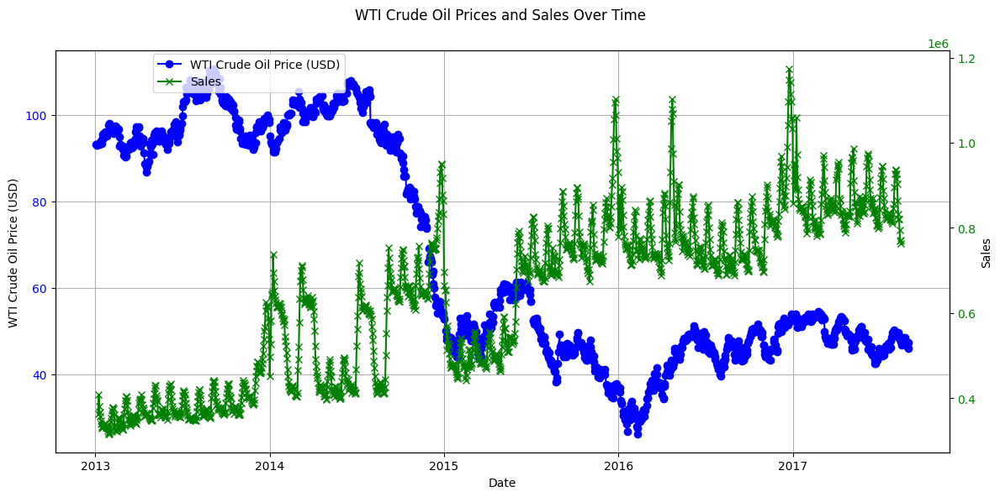

In [71]:
# Create a figure and axis objects
fig, ax1 = plt.subplots(figsize=(12, 6))

# Plot WTI Crude Oil prices
ax1.plot(df_oil.index, df_oil['dcoilwtico'], color='blue', marker='o', linestyle='-', label='WTI Crude Oil Price (USD)')
ax1.set_xlabel('Date')
ax1.set_ylabel('WTI Crude Oil Price (USD)')
ax1.tick_params(axis='y', labelcolor='blue')
ax1.grid(True)

# Create a twin axis sharing the same x-axis
ax2 = ax1.twinx()

# Plot sales data
ax2.plot(df_daily_sales.index, df_daily_sales['rolling_average_7_day'], color='green', marker='x', linestyle='-', label='Sales')
ax2.set_ylabel('Sales')
ax2.tick_params(axis='y', labelcolor='green')

# Title and legend
fig.suptitle('WTI Crude Oil Prices and Sales Over Time')
fig.legend(loc="upper left", bbox_to_anchor=(0.15, 0.9))

plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

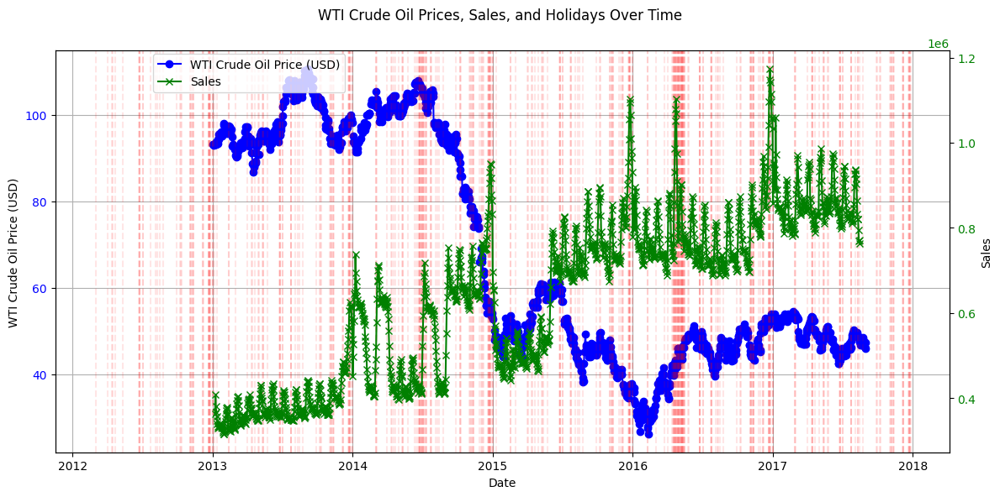

In [103]:
import matplotlib.pyplot as plt

# Create a figure and axis objects
fig, ax1 = plt.subplots(figsize=(12, 6))

# Plot WTI Crude Oil prices
ax1.plot(df_oil.index, df_oil['dcoilwtico'], color='blue', marker='o', linestyle='-', label='WTI Crude Oil Price (USD)')
ax1.set_xlabel('Date')
ax1.set_ylabel('WTI Crude Oil Price (USD)')
ax1.tick_params(axis='y', labelcolor='blue')
ax1.grid(True)

# Create a twin axis sharing the same x-axis
ax2 = ax1.twinx()

# Plot sales data
ax2.plot(df_daily_sales.index, df_daily_sales['rolling_average_7_day'], color='green', marker='x', linestyle='-', label='Sales')
ax2.set_ylabel('Sales')
ax2.tick_params(axis='y', labelcolor='green')

# Mark holidays
for holiday_date in df_holidays['date']:
    ax1.axvline(x=holiday_date, color='red', linestyle='--', alpha=0.1)
    #ax2.axvline(x=holiday_date, color='red', linestyle='--', alpha=0.1)

# Title and legend
fig.suptitle('WTI Crude Oil Prices, Sales, and Holidays Over Time')
fig.legend(loc="upper left", bbox_to_anchor=(0.15, 0.9))

plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


## Notes 
* Seems there could be some correlation between oil and total sales, but not clear. Could be worth splitting out the categories to see further trends

In [112]:
df_daily_sales_by_family = df_train.groupby(['date', 'family'])['sales'].sum().reset_index()

In [107]:
%matplotlib inline
from tslearn.clustering import silhouette_score
from sklearn.decomposition import PCA

import numpy as np
import matplotlib.pyplot as plt
plt.rcParams['figure.figsize'] = [25, 8]

from tslearn.clustering import TimeSeriesKMeans
from tslearn.datasets import CachedDatasets
from tslearn.preprocessing import TimeSeriesScalerMeanVariance
import pandas as pd

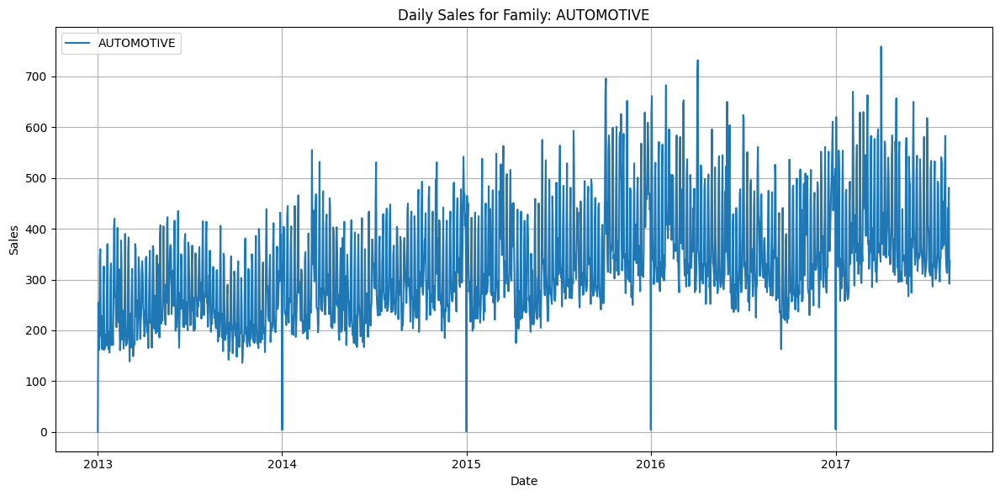

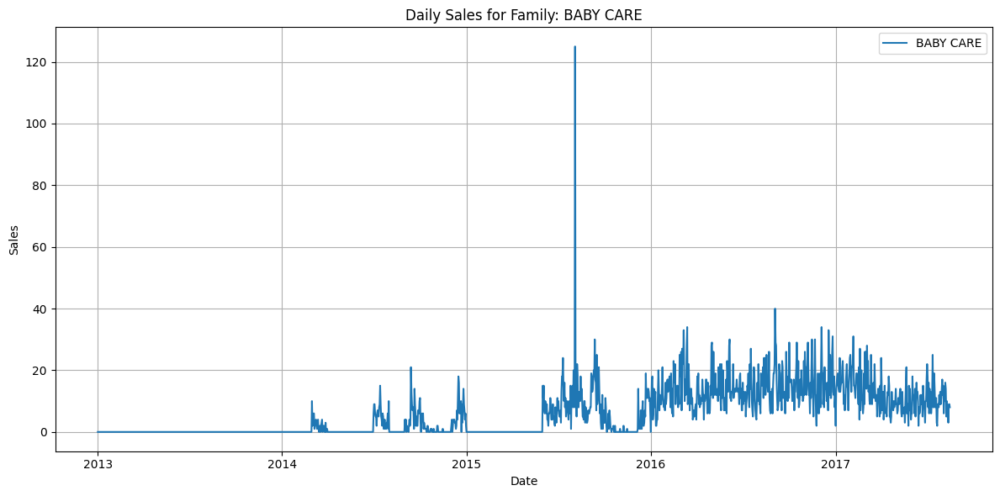

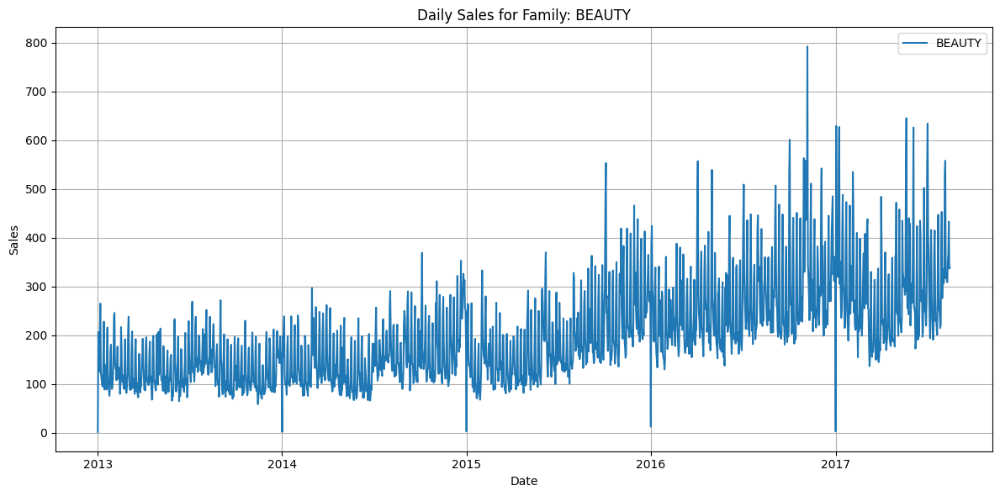

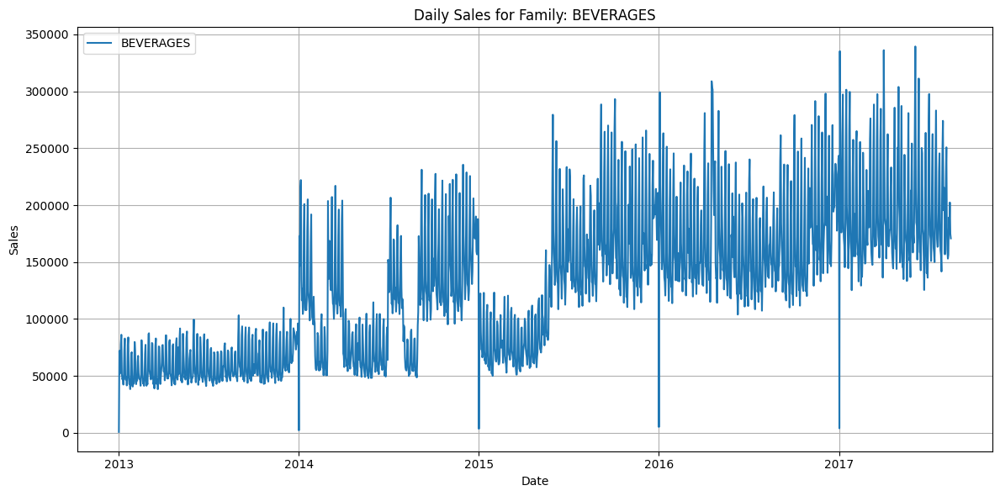

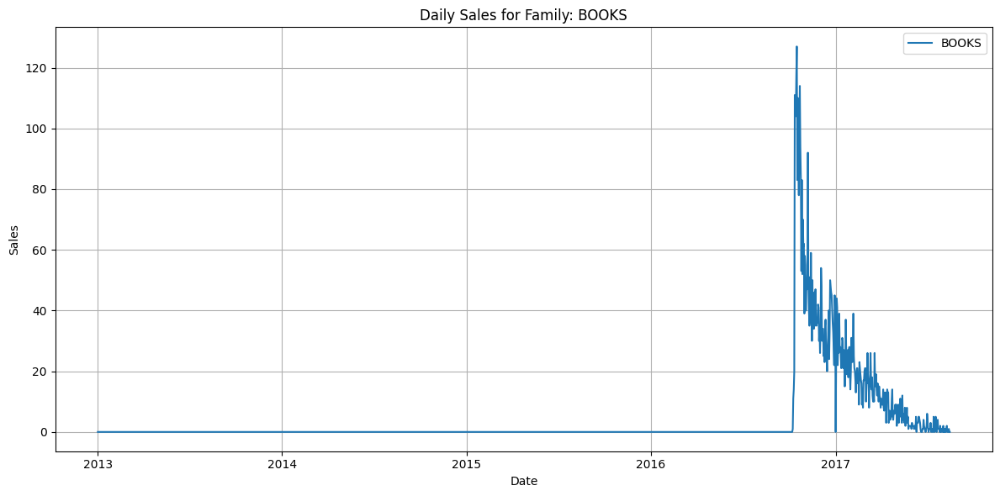

...

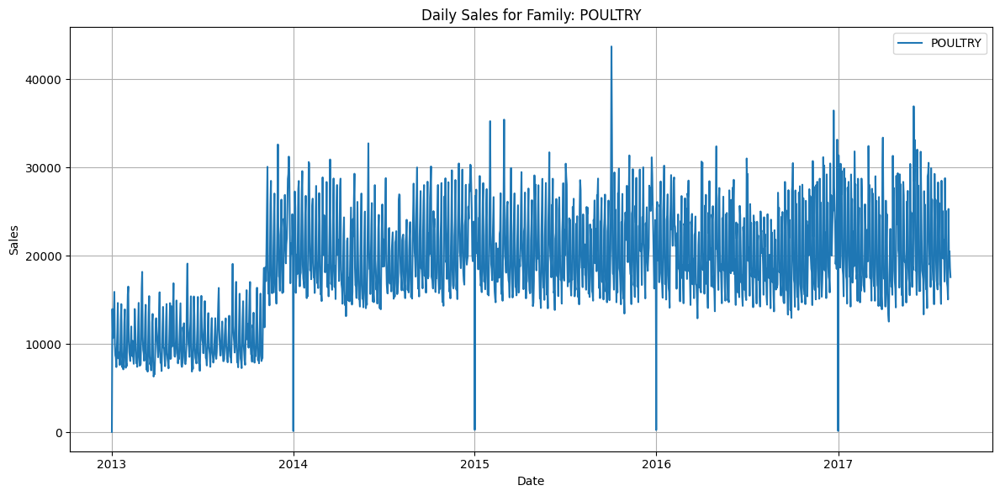

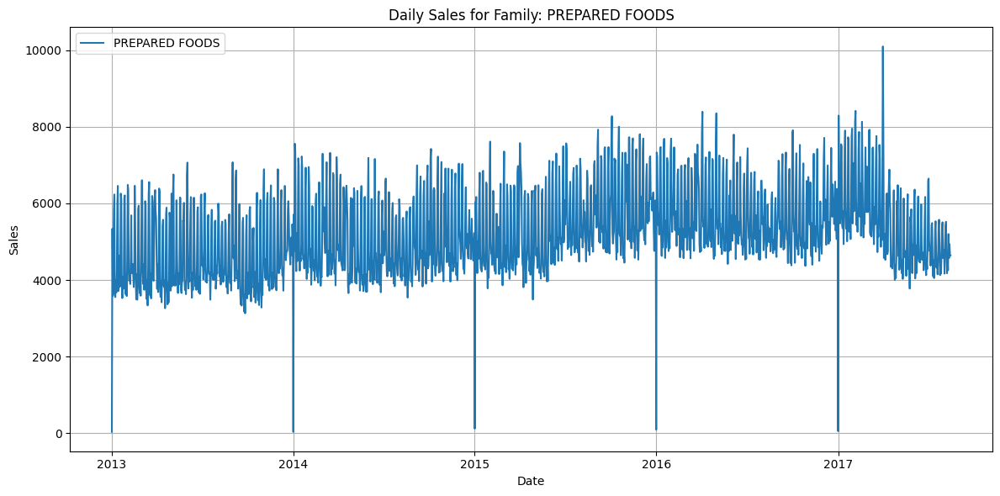

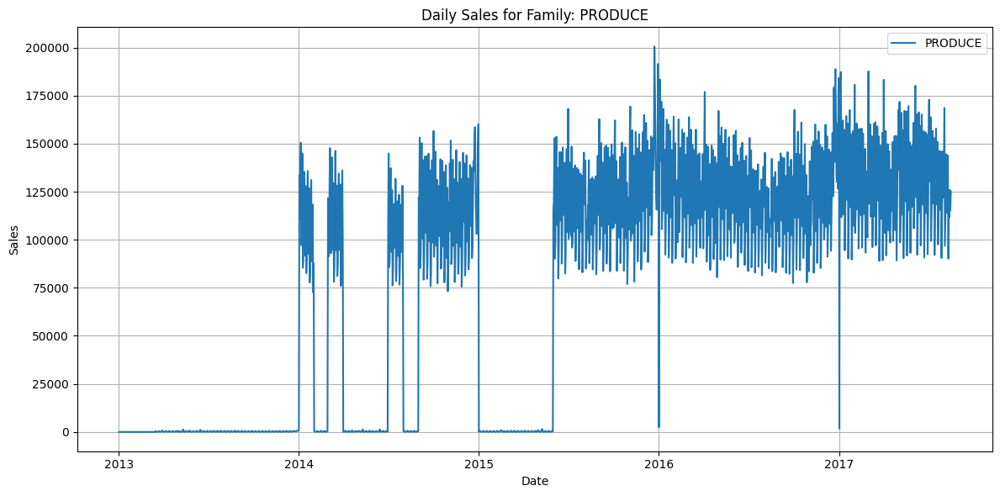

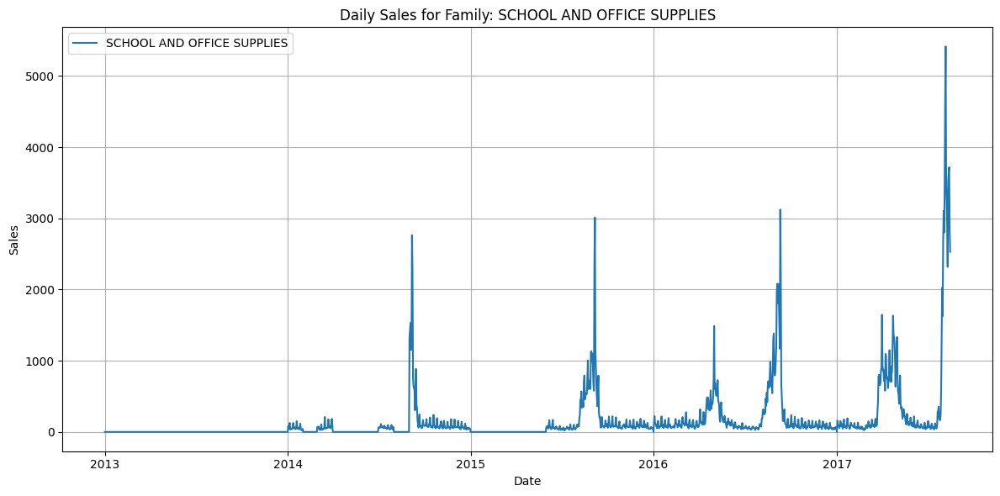

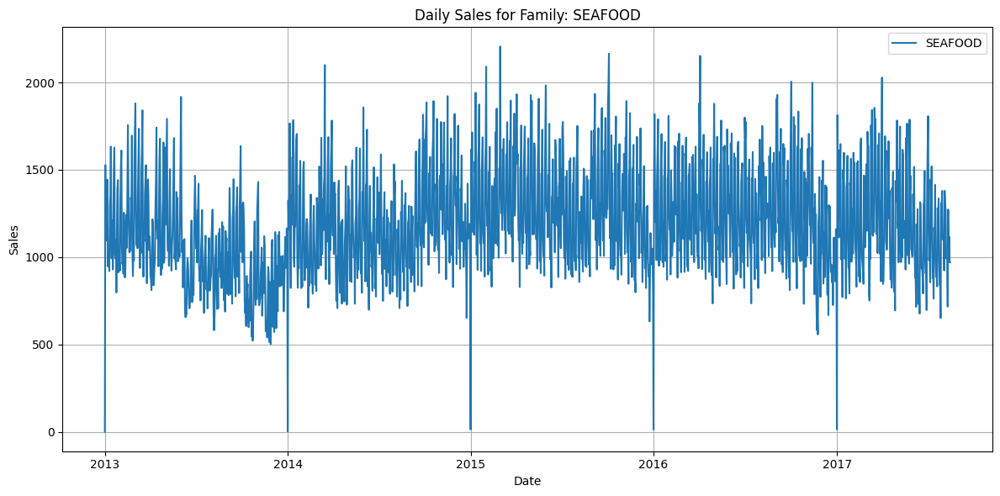

In [113]:
import matplotlib.pyplot as plt

# Convert date column to datetime if it's not already in datetime format
df_daily_sales_by_family['date'] = pd.to_datetime(df_daily_sales_by_family['date'])

# Get unique families
unique_families = df_daily_sales_by_family['family'].unique()

# Plot each family's sales separately
for family in unique_families:
    # Filter the data for the current family
    family_data = df_daily_sales_by_family[df_daily_sales_by_family['family'] == family]
    
    # Plot the sales data for the current family
    plt.figure(figsize=(12, 6))  # Set the figure size
    plt.plot(family_data['date'], family_data['sales'], label=family)
    
    # Add labels and title
    plt.xlabel('Date')
    plt.ylabel('Sales')
    plt.title(f'Daily Sales for Family: {family}')
    plt.legend()  # Show legend with family name
    plt.grid(True)  # Show grid
    plt.tight_layout()  # Adjust layout to prevent clipping of labels
    plt.show()

In [69]:
sum(np.isnan(df_daily_sales_by_family['sales']))

0

In [ ]:
import pandas as pd
from sklearn.preprocessing import MinMaxScaler

# Assuming you have a DataFrame named df containing your data

# Create a new DataFrame to store the normalized sales
normalized_df = pd.DataFrame(columns=df_daily_sales_by_family.columns)

# Iterate over unique families
for family in df_daily_sales_by_family['family'].unique():
    # Extract data for the current family
    family_data = df_daily_sales_by_family[df_daily_sales_by_family['family'] == family].copy()
    
    # Normalize the sales using MinMaxScaler
    scaler = MinMaxScaler()
    family_data['salesNorm'] = scaler.fit_transform(family_data['sales'].values.reshape(-1, 1))
    
    # Append the normalized data to the new DataFrame
    normalized_df = pd.concat([normalized_df, family_data], ignore_index=True)

# Print the head of the normalized DataFrame
print(normalized_df.head())


         date      family  sales  salesNorm
0  2013-01-01  AUTOMOTIVE    0.0   0.000000
1  2013-01-02  AUTOMOTIVE  255.0   0.335968
2  2013-01-03  AUTOMOTIVE  161.0   0.212121
3  2013-01-04  AUTOMOTIVE  169.0   0.222661
4  2013-01-05  AUTOMOTIVE  342.0   0.450593


In [102]:
# Initialize an empty list to store individual dataframes for each family
mySeries = []

# Iterate over unique families
for family in normalized_df['family'].unique():
    # Extract data for the current family
    family_data = normalized_df[normalized_df['family'] == family][['date', 'salesNorm']].copy()
    
    # Set the index of family_data to 'date'
    family_data.set_index('date', inplace=True)
    
    # Rename the column to the family name
    family_data.rename(columns={'salesNorm': f'{family}_data'}, inplace=True)
    
    # Append the dataframe to the list
    mySeries.append(family_data)

# Printing the first few rows of each dataframe in mySeries (optional)
for df_family in mySeries:
    print(df_family.head())


            AUTOMOTIVE_data
date                       
2013-01-01         0.000000
2013-01-02         0.335968
2013-01-03         0.212121
2013-01-04         0.222661
2013-01-05         0.450593
            BABY CARE_data
date                      
2013-01-01             0.0
2013-01-02             0.0
2013-01-03             0.0
2013-01-04             0.0
2013-01-05             0.0
            BEAUTY_data
date                   
2013-01-01     0.000000
2013-01-02     0.259494
2013-01-03     0.155696
2013-01-04     0.165823
2013-01-05     0.239241
            BEVERAGES_data
date                      
2013-01-01        0.000000
2013-01-02        0.210556
2013-01-03        0.151517
2013-01-04        0.157608
2013-01-05        0.227470
            BOOKS_data
date                  
2013-01-01         0.0
2013-01-02         0.0
2013-01-03         0.0
2013-01-04         0.0
2013-01-05         0.0
            BREAD/BAKERY_data
date                         
2013-01-01           0.000000
2013-01

In [74]:
df_daily_sales_by_family

,date,family,sales,salesNorm
0,2013-01-01,AUTOMOTIVE,0.000000,0
1,2013-01-01,BABY CARE,0.000000,0
2,2013-01-01,BEAUTY,2.000000,0
3,2013-01-01,BEVERAGES,810.000000,0
4,2013-01-01,BOOKS,0.000000,0
...,...,...,...,...
55567,2017-08-15,POULTRY,17586.709986,0
55568,2017-08-15,PREPARED FOODS,4641.522980,0
55569,2017-08-15,PRODUCE,125108.971000,0
55570,2017-08-15,SCHOOL AND OFFICE SUPPLIES,2530.000000,0


Explained variance ratio:
[5.36104233e-01 1.11559423e-01 5.81236662e-02 3.53452799e-02
 3.44590278e-02 3.00082125e-02 2.79403409e-02 2.19776922e-02
 1.75676033e-02 1.61880392e-02 1.49888292e-02 1.22112233e-02
 1.10919301e-02 1.00824894e-02 8.33891367e-03 8.12746237e-03
 7.20028117e-03 5.80604412e-03 5.12276881e-03 4.65524166e-03
 3.78537752e-03 3.36482945e-03 3.00293441e-03 2.56538264e-03
 2.02903983e-03 1.58472918e-03 1.46536921e-03 1.36749199e-03
 1.10335398e-03 9.49995206e-04 8.30406213e-04 5.95524130e-04
 4.56863787e-04]


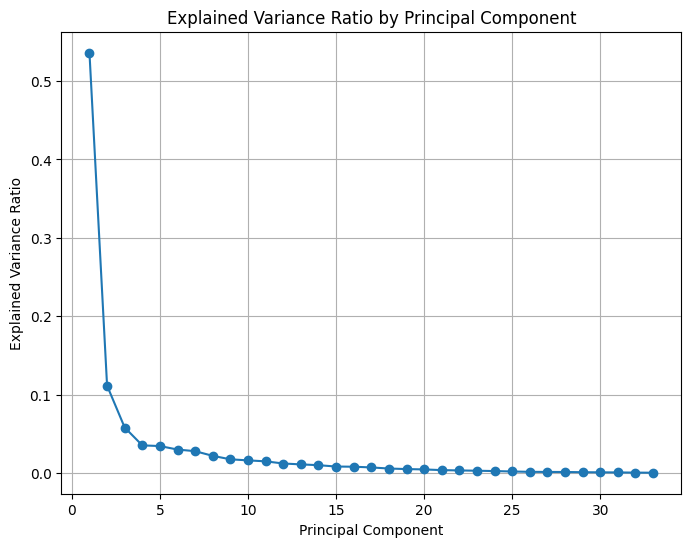

In [11]:
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler

# Pivot the data
df_pivot = df_daily_sales_by_family.pivot(index='date', columns='family', values='sales').fillna(0)

# Standardize the data
scaler = StandardScaler()
scaled_data = scaler.fit_transform(df_pivot)

# Apply PCA
pca = PCA()
pca.fit(scaled_data)

# Get the explained variance ratio
explained_variance_ratio = pca.explained_variance_ratio_

# Print the explained variance ratio for each principal component
print("Explained variance ratio:")
print(explained_variance_ratio)

# Plot the explained variance ratio
plt.figure(figsize=(8, 6))
plt.plot(range(1, len(explained_variance_ratio) + 1), explained_variance_ratio, marker='o', linestyle='-')
plt.xlabel('Principal Component')
plt.ylabel('Explained Variance Ratio')
plt.title('Explained Variance Ratio by Principal Component')
plt.grid(True)
plt.show()


In [116]:
df_pivot = df_pivot.T

In [117]:
df_pivot

date,2013-01-01,2013-01-02,2013-01-03,2013-01-04,2013-01-05,2013-01-06,2013-01-07,2013-01-08,2013-01-09,2013-01-10,...,2017-08-06,2017-08-07,2017-08-08,2017-08-09,2017-08-10,2017-08-11,2017-08-12,2017-08-13,2017-08-14,2017-08-15
family,,,,,,,,,,,,,,,,,,,,,
AUTOMOTIVE,0.000000,255.000000,161.000000,169.000000,342.000000,360.000000,189.000000,229.000000,164.000000,164.000000,...,583.000000,355.000000,327.000000,314.000000,313.000000,441.000000,403.000000,481.000000,292.000000,337.000000
BABY CARE,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,16.000000,14.000000,5.000000,10.000000,5.000000,7.000000,3.000000,9.000000,9.000000,8.000000
BEAUTY,2.000000,207.000000,125.000000,133.000000,191.000000,265.000000,124.000000,116.000000,104.000000,96.000000,...,558.000000,317.000000,328.000000,315.000000,309.000000,351.000000,369.000000,433.000000,337.000000,339.000000
BEVERAGES,810.000000,72092.000000,52105.000000,54167.000000,77818.000000,86184.000000,51619.000000,46941.000000,47910.000000,42390.000000,...,250784.000000,179419.000000,160636.000000,153010.000000,156449.000000,189111.000000,182318.000000,202354.000000,174832.000000,170773.000000
BOOKS,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,1.000000,0.000000,1.000000,2.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000
BREAD/BAKERY,180.589000,26246.319000,18456.480020,16721.969010,22367.761080,26861.665000,17646.151000,15805.764020,16002.830020,14134.597030,...,38117.948000,29332.098000,26226.518000,25880.209000,23947.023000,28204.486000,27403.548000,33262.757000,28002.457000,29158.195020
CELEBRATION,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,634.000000,539.000000,546.000000,593.000000,874.000000,870.000000,849.000000,544.000000,594.000000,597.000000
CLEANING,186.000000,74629.000000,55893.000000,52064.000000,70128.000000,74295.000000,50036.000000,45075.000000,42958.000000,38621.000000,...,77829.000000,60357.000000,53472.000000,50985.000000,45205.000000,55682.000000,57935.000000,61757.000000,55032.000000,58474.000000
DAIRY,143.000000,23381.000000,18001.000000,18148.000000,23082.000000,23660.000000,15839.000000,14532.000000,16250.000000,13557.000000,...,60062.000000,44167.000000,38198.000000,42374.000000,34648.000000,44909.000000,42854.000000,50112.000000,43050.000000,40707.000000


In [125]:
XTrain = df_pivot.to_numpy()
XCategories = df_pivot.index

In [123]:
XTrain

array([[0.00000000e+00, 2.55000000e+02, 1.61000000e+02, ...,
        4.81000000e+02, 2.92000000e+02, 3.37000000e+02],
       [0.00000000e+00, 0.00000000e+00, 0.00000000e+00, ...,
        9.00000000e+00, 9.00000000e+00, 8.00000000e+00],
       [2.00000000e+00, 2.07000000e+02, 1.25000000e+02, ...,
        4.33000000e+02, 3.37000000e+02, 3.39000000e+02],
       ...,
       [0.00000000e+00, 0.00000000e+00, 0.00000000e+00, ...,
        1.25923802e+05, 1.15257596e+05, 1.25108971e+05],
       [0.00000000e+00, 0.00000000e+00, 0.00000000e+00, ...,
        3.71800000e+03, 2.82600000e+03, 2.53000000e+03],
       [0.00000000e+00, 1.52675000e+03, 1.09431099e+03, ...,
        1.11804700e+03, 9.70679999e+02, 9.70177005e+02]])

In [127]:
seed = 0
np.random.seed(seed)
x_train = TimeSeriesScalerMeanVariance().fit_transform(XTrain)
sz=x_train.shape[1]

In [130]:
x_train.shape

(33, 1684, 1)

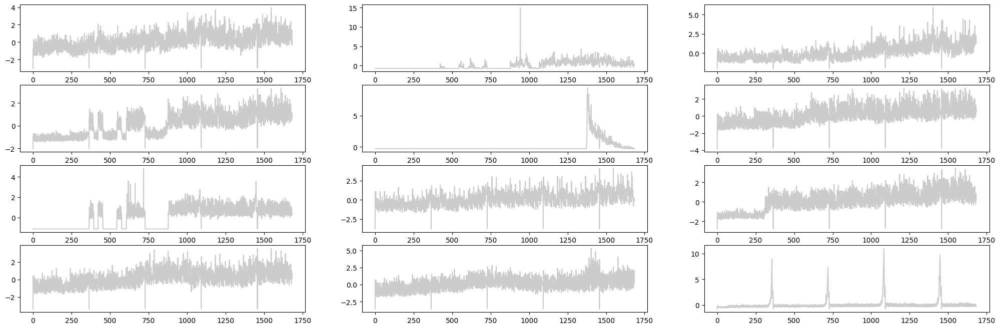

In [131]:
for yi in range(12):
    plt.subplot(4, 3, yi + 1)
    plt.plot(x_train[yi].ravel(), "k-", alpha=.2)
#     plt.text(0.55, 0.85,'Class Label: %d' % (y_train[yi]))

In [179]:
Sum_of_squared_distances = []
K = range(4,13)
for k in K:
    km = TimeSeriesKMeans(n_clusters=k,
                          n_init=2,
                          metric="dtw",
                          verbose=True,
                          max_iter_barycenter=10,
                          random_state=0)
    
    km = km.fit(x_train)
    Sum_of_squared_distances.append(km.inertia_)

Init 1


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  33 out of  33 | elapsed:    0.6s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  99 out of  99 | elapsed:    1.8s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  99 out of  99 | elapsed:    1.8s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  99 out of  99 | elapsed:    1.8s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 132 out of 132 | elapsed:    2.4s finished


401.267 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 132 out of 132 | elapsed:    2.4s finished


258.266 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 132 out of 132 | elapsed:    2.4s finished


258.266 --> 
Init 2


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  33 out of  33 | elapsed:    0.5s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  99 out of  99 | elapsed:    1.9s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  99 out of  99 | elapsed:    1.8s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  99 out of  99 | elapsed:    1.8s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 132 out of 132 | elapsed:    2.4s finished


416.537 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 132 out of 132 | elapsed:    2.4s finished


265.186 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 132 out of 132 | elapsed:    2.4s finished


260.997 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 132 out of 132 | elapsed:    2.4s finished


260.997 --> 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 132 out of 132 | elapsed:    2.4s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Init 1


[Parallel(n_jobs=1)]: Done  33 out of  33 | elapsed:    0.5s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  99 out of  99 | elapsed:    1.8s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  99 out of  99 | elapsed:    1.8s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  99 out of  99 | elapsed:    1.8s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  99 out of  99 | elapsed:    1.8s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 165 out of 165 | elapsed:    3.0s finished


370.210 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 165 out of 165 | elapsed:    3.1s finished


231.797 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 165 out of 165 | elapsed:    3.0s finished


221.276 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 165 out of 165 | elapsed:    3.0s finished


221.276 --> 
Init 2


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  33 out of  33 | elapsed:    0.5s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  99 out of  99 | elapsed:    2.9s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  99 out of  99 | elapsed:    1.9s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  99 out of  99 | elapsed:    1.8s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  99 out of  99 | elapsed:    1.8s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 165 out of 165 | elapsed:    3.1s finished


338.349 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 165 out of 165 | elapsed:    3.1s finished


221.442 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 165 out of 165 | elapsed:    3.0s finished


221.442 --> 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 165 out of 165 | elapsed:    3.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Init 1


[Parallel(n_jobs=1)]: Done  33 out of  33 | elapsed:    0.5s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  99 out of  99 | elapsed:    1.8s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  99 out of  99 | elapsed:    1.8s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  99 out of  99 | elapsed:    1.8s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  99 out of  99 | elapsed:    1.8s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  99 out of  99 | elapsed:    1.8s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 198 out of 198 | elapsed:    3.7s finished


350.387 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 198 out of 198 | elapsed:    3.7s finished


232.258 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 198 out of 198 | elapsed:    3.8s finished


228.918 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 198 out of 198 | elapsed:    3.8s finished


220.832 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 198 out of 198 | elapsed:    3.7s finished


220.832 --> 
Init 2


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  33 out of  33 | elapsed:    0.6s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  99 out of  99 | elapsed:    1.8s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  99 out of  99 | elapsed:    1.8s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  99 out of  99 | elapsed:    1.8s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  99 out of  99 | elapsed:    1.8s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  99 out of  99 | elapsed:    1.8s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_j

319.112 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 198 out of 198 | elapsed:    3.7s finished


193.487 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 198 out of 198 | elapsed:    3.8s finished


189.351 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 198 out of 198 | elapsed:    3.8s finished


189.351 --> 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 198 out of 198 | elapsed:    3.8s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Init 1


[Parallel(n_jobs=1)]: Done  33 out of  33 | elapsed:    0.6s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  99 out of  99 | elapsed:    1.9s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  99 out of  99 | elapsed:    1.8s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  99 out of  99 | elapsed:    1.8s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  99 out of  99 | elapsed:    1.9s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  99 out of  99 | elapsed:    1.8s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  99 out of  99 | elapsed:    1.8s finished
[Parallel(n_jobs=1)]: Us

323.519 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 231 out of 231 | elapsed:    4.4s finished


207.258 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 231 out of 231 | elapsed:    4.3s finished


203.719 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 231 out of 231 | elapsed:    4.3s finished


195.634 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 231 out of 231 | elapsed:    4.3s finished


195.634 --> 
Init 2


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  33 out of  33 | elapsed:    0.6s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  99 out of  99 | elapsed:    1.8s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  99 out of  99 | elapsed:    1.8s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  99 out of  99 | elapsed:    1.8s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  99 out of  99 | elapsed:    1.8s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  99 out of  99 | elapsed:    1.8s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_j

289.457 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 231 out of 231 | elapsed:    4.3s finished


181.374 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 231 out of 231 | elapsed:    4.6s finished


181.374 --> 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 231 out of 231 | elapsed:    4.3s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Init 1


[Parallel(n_jobs=1)]: Done  33 out of  33 | elapsed:    0.5s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 132 out of 132 | elapsed:    2.4s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 132 out of 132 | elapsed:    2.5s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 132 out of 132 | elapsed:    2.4s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 132 out of 132 | elapsed:    2.4s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 132 out of 132 | elapsed:    2.4s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 132 out of 132 | elapsed:    2.6s finished
[Parallel(n_jobs=1)]: Us

278.068 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 264 out of 264 | elapsed:    5.0s finished


172.110 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 264 out of 264 | elapsed:    5.0s finished


169.817 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 264 out of 264 | elapsed:    5.0s finished


169.817 --> 
Init 2


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  33 out of  33 | elapsed:    0.5s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 132 out of 132 | elapsed:    2.4s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 132 out of 132 | elapsed:    2.4s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 132 out of 132 | elapsed:    2.4s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 132 out of 132 | elapsed:    2.5s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 132 out of 132 | elapsed:    2.4s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_j

264.352 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 264 out of 264 | elapsed:    5.0s finished


185.804 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 264 out of 264 | elapsed:    4.9s finished


185.804 --> 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 264 out of 264 | elapsed:    5.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Init 1


[Parallel(n_jobs=1)]: Done  33 out of  33 | elapsed:    0.6s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 132 out of 132 | elapsed:    2.4s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 132 out of 132 | elapsed:    2.5s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 132 out of 132 | elapsed:    2.5s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 132 out of 132 | elapsed:    2.5s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 132 out of 132 | elapsed:    2.4s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 132 out of 132 | elapsed:    2.4s finished
[Parallel(n_jobs=1)]: Us

238.627 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 297 out of 297 | elapsed:    5.7s finished


156.135 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 297 out of 297 | elapsed:    5.6s finished


156.135 --> 
Init 2


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  33 out of  33 | elapsed:    0.5s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 132 out of 132 | elapsed:    2.5s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 132 out of 132 | elapsed:    2.4s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 132 out of 132 | elapsed:    2.5s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 132 out of 132 | elapsed:    2.4s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 132 out of 132 | elapsed:    2.5s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_j

254.887 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 297 out of 297 | elapsed:    6.0s finished


161.677 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 297 out of 297 | elapsed:    5.9s finished


161.677 --> 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 297 out of 297 | elapsed:    5.7s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Init 1


[Parallel(n_jobs=1)]: Done  33 out of  33 | elapsed:    0.5s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 132 out of 132 | elapsed:    2.5s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 132 out of 132 | elapsed:    2.4s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 132 out of 132 | elapsed:    2.5s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 132 out of 132 | elapsed:    2.5s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 132 out of 132 | elapsed:    2.5s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 132 out of 132 | elapsed:    2.4s finished
[Parallel(n_jobs=1)]: Us

220.341 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 330 out of 330 | elapsed:    6.2s finished


141.658 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 330 out of 330 | elapsed:    6.2s finished


141.658 --> 
Init 2


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  33 out of  33 | elapsed:    0.5s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 132 out of 132 | elapsed:    2.4s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 132 out of 132 | elapsed:    2.5s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 132 out of 132 | elapsed:    2.4s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 132 out of 132 | elapsed:    2.5s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 132 out of 132 | elapsed:    2.4s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_j

230.311 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 330 out of 330 | elapsed:    6.3s finished


144.221 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 330 out of 330 | elapsed:    6.3s finished


144.221 --> 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 330 out of 330 | elapsed:    6.3s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Init 1


[Parallel(n_jobs=1)]: Done  33 out of  33 | elapsed:    0.6s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 132 out of 132 | elapsed:    2.5s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 132 out of 132 | elapsed:    2.5s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 132 out of 132 | elapsed:    2.5s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 132 out of 132 | elapsed:    2.4s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 132 out of 132 | elapsed:    2.5s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 132 out of 132 | elapsed:    2.5s finished
[Parallel(n_jobs=1)]: Us

201.319 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 363 out of 363 | elapsed:    6.9s finished


127.369 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 363 out of 363 | elapsed:    6.9s finished


127.369 --> 
Init 2


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  33 out of  33 | elapsed:    0.5s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 132 out of 132 | elapsed:    2.4s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 132 out of 132 | elapsed:    2.5s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 132 out of 132 | elapsed:    2.4s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 132 out of 132 | elapsed:    2.6s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 132 out of 132 | elapsed:    2.4s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_j

201.076 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 363 out of 363 | elapsed:    7.0s finished


131.373 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 363 out of 363 | elapsed:    7.5s finished


131.373 --> 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 363 out of 363 | elapsed:    7.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Init 1


[Parallel(n_jobs=1)]: Done  33 out of  33 | elapsed:    0.6s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 132 out of 132 | elapsed:    2.6s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 132 out of 132 | elapsed:    2.5s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 132 out of 132 | elapsed:    2.5s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 132 out of 132 | elapsed:    2.5s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 132 out of 132 | elapsed:    2.5s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 132 out of 132 | elapsed:    2.5s finished
[Parallel(n_jobs=1)]: Us

186.118 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 396 out of 396 | elapsed:    7.7s finished


115.949 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 396 out of 396 | elapsed:    7.6s finished


115.949 --> 
Init 2


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  33 out of  33 | elapsed:    0.5s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 132 out of 132 | elapsed:    2.5s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 132 out of 132 | elapsed:    2.5s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 132 out of 132 | elapsed:    2.5s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 132 out of 132 | elapsed:    2.5s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 132 out of 132 | elapsed:    2.5s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_j

181.510 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 396 out of 396 | elapsed:    8.2s finished


125.492 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 396 out of 396 | elapsed:    7.6s finished


125.492 --> 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 396 out of 396 | elapsed:    7.6s finished


In [137]:
Sum_of_squared_distances

[308.3760670673145,
 290.0447499545095,
 258.2664444511443,
 221.27552797309536,
 189.35107258563184,
 181.37431356388802]

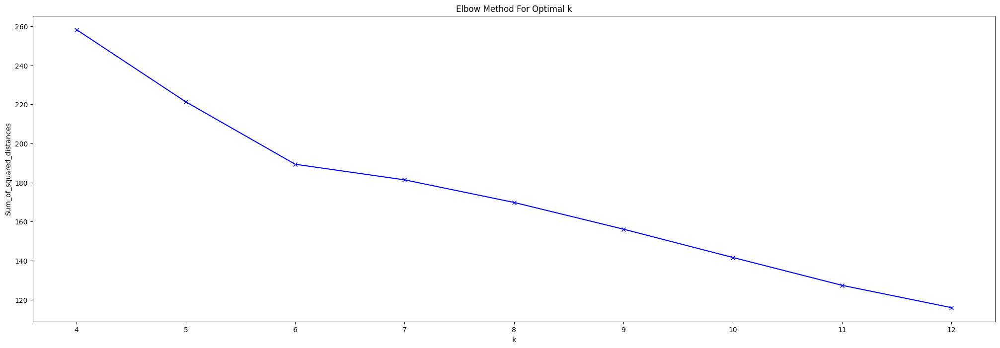

In [180]:
plt.plot(K, Sum_of_squared_distances, 'bx-')
plt.xlabel('k')
plt.ylabel('Sum_of_squared_distances')
plt.title('Elbow Method For Optimal k')
plt.show()

In [141]:
n_clusters = 6
sz = x_train.shape[1]
seed = 0

Euclidean k-means


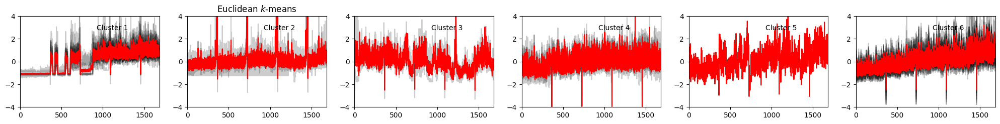

In [144]:
print("Euclidean k-means")
km = TimeSeriesKMeans(n_clusters=n_clusters, verbose=False, random_state=seed)
y_pred_km = km.fit_predict(x_train)

plt.figure()
for yi in range(n_clusters):
    plt.subplot(3, n_clusters, yi + 1)
    for xx in x_train[y_pred_km == yi]:
        plt.plot(xx.ravel(), "k-", alpha=.2)
    plt.plot(km.cluster_centers_[yi].ravel(), "r-")
    plt.xlim(0, sz)
    plt.ylim(-4, 4)
    plt.text(0.55, 0.85,'Cluster %d' % (yi + 1),
             transform=plt.gca().transAxes)
    if yi == 1:
        plt.title("Euclidean $k$-means")

In [150]:
y_pred_km.shape

(33,)

In [151]:
XCategories.shape

(33,)

In [170]:
myDict = {}

for i in range(len(XCategories)):
    key = XCategories[i]
    value = y_pred_km[i]
    myDict[key] = value


In [175]:
def familyCluster(fam):
    return myDict.get(fam)

In [177]:
df_train['familycluster'] = df_train['family'].apply(lambda x: familyCluster(x))

In [178]:
df_train

,id,date,store_nbr,family,sales,onpromotion,familycluster
0,0,2013-01-01,1,AUTOMOTIVE,0.000,0,5
1,1,2013-01-01,1,BABY CARE,0.000,0,0
2,2,2013-01-01,1,BEAUTY,0.000,0,5
3,3,2013-01-01,1,BEVERAGES,0.000,0,0
4,4,2013-01-01,1,BOOKS,0.000,0,5
...,...,...,...,...,...,...,...
3000883,3000883,2017-08-15,9,POULTRY,438.133,0,3
3000884,3000884,2017-08-15,9,PREPARED FOODS,154.553,1,3
3000885,3000885,2017-08-15,9,PRODUCE,2419.729,148,0
3000886,3000886,2017-08-15,9,SCHOOL AND OFFICE SUPPLIES,121.000,8,5


In [13]:
scores_pca = pca.transform(scaled_data)


In [14]:
scores_pca

array([[-12.28314256,  -6.89032865,  -0.10457665,  -0.34021984],
       [ -2.18440442,   3.11765575,  -0.45094568,   0.53748687],
       [ -5.06533969,   0.36734252,  -0.17204914,   0.20361916],
       ...,
       [  5.32889642,  -1.8065263 ,  -1.30160661,  -4.78584984],
       [  2.701166  ,  -2.13811935,  -1.14330426,  -3.1430474 ],
       [  2.30010312,  -2.25693616,  -0.71887171,  -2.99801505]])

In [19]:
from sklearn.cluster import KMeans

wcss = []
for i in range(1, 21):
    kmeans_pca = KMeans(n_clusters = i, init = 'k-means++', random_state = 42)
    kmeans_pca.fit(scores_pca)
    wcss.append(kmeans_pca.inertia_)

C:\Python310\lib\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
C:\Python310\lib\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
C:\Python310\lib\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
C:\Python310\lib\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  s

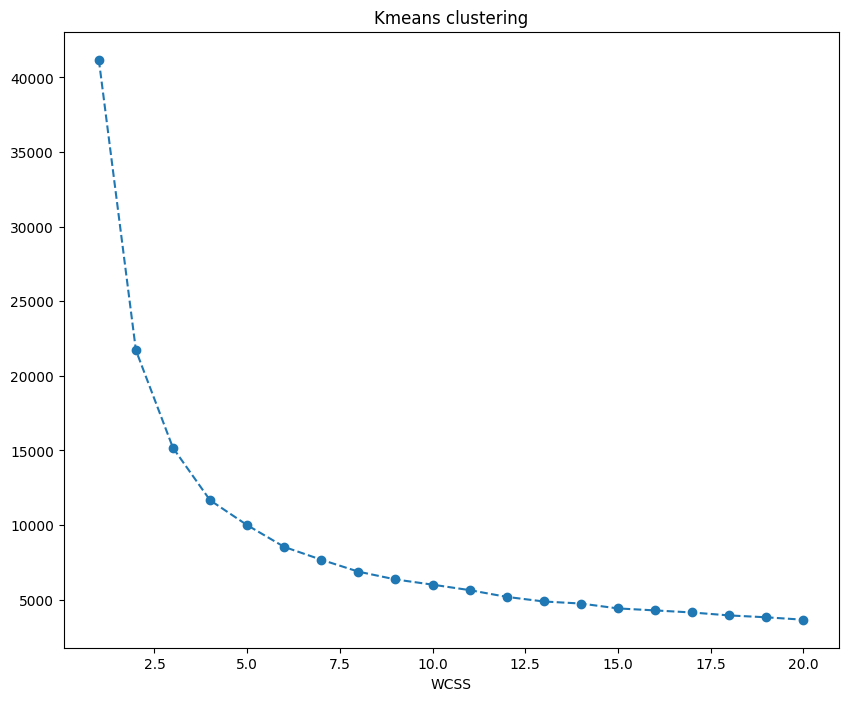

In [20]:
plt.figure(figsize = (10, 8))
plt.plot(range(1, 21), wcss, marker = 'o', linestyle = '--')
plt.xlabel('WCSS')
plt.title('Kmeans clustering')
plt.show()

In [21]:
kmeans_pca = KMeans(n_clusters = 4, init = 'k-means++', random_state = 42)
kmeans_pca.fit(scores_pca)

C:\Python310\lib\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


KMeans(n_clusters=4, random_state=42)

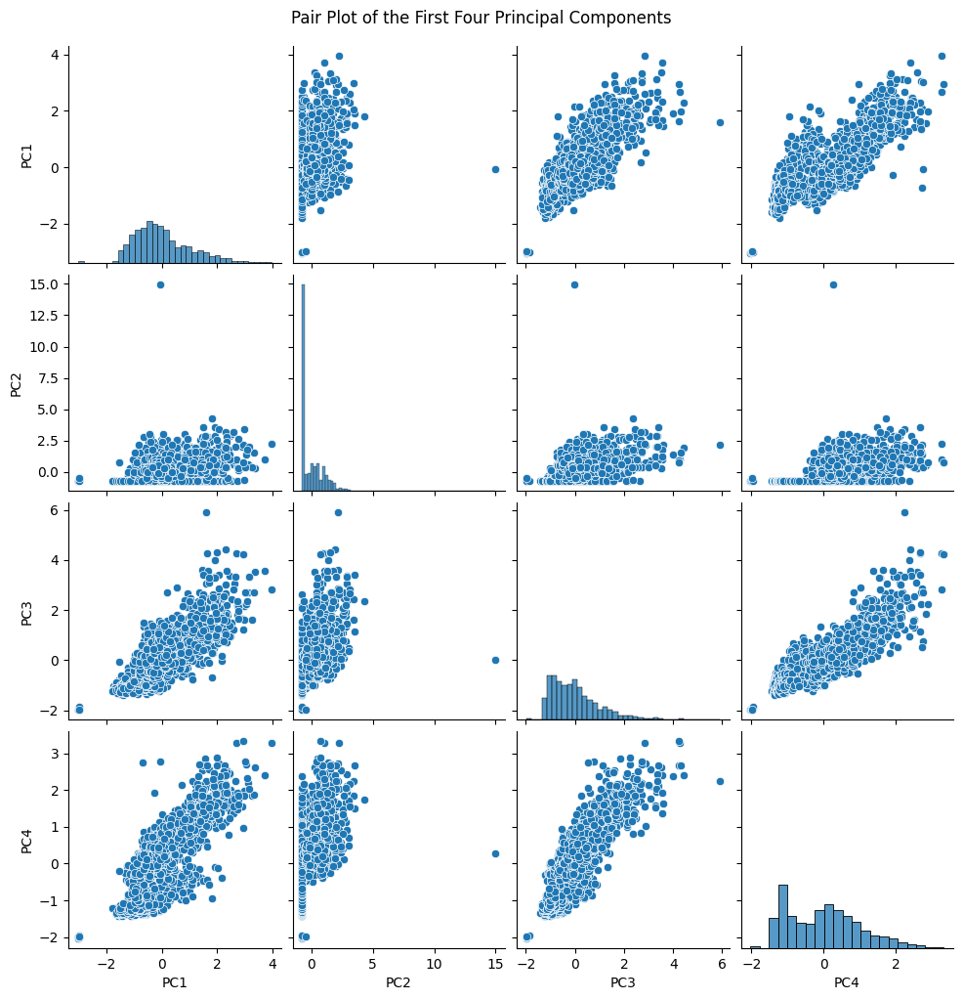

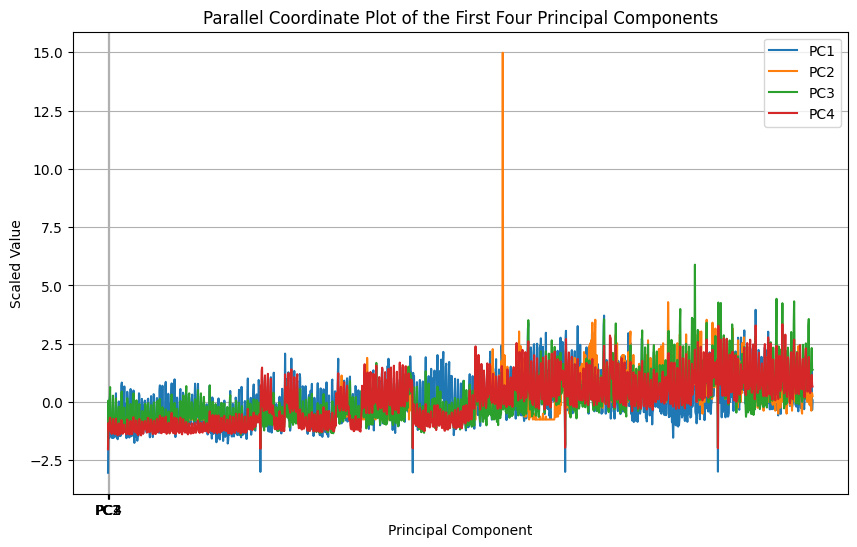

In [78]:
import seaborn as sns
import matplotlib.pyplot as plt

# Convert scaled data to a DataFrame
scaled_df = pd.DataFrame(scaled_data[:, :4], columns=['PC1', 'PC2', 'PC3', 'PC4'])

# Pair Plot
sns.pairplot(scaled_df)
plt.suptitle('Pair Plot of the First Four Principal Components', y=1.02)
plt.show()

# Parallel Coordinate Plot
plt.figure(figsize=(10, 6))
sns.lineplot(data=scaled_df, dashes=False)
plt.title('Parallel Coordinate Plot of the First Four Principal Components')
plt.xlabel('Principal Component')
plt.ylabel('Scaled Value')
plt.xticks(ticks=[0, 1, 2, 3], labels=['PC1', 'PC2', 'PC3', 'PC4'])
plt.grid(True)
plt.show()


In [81]:
scaled_df

,PC1,PC2,PC3,PC4
0,-3.033910,-0.751251,-1.978959,-2.028795
1,-0.685731,-0.751251,0.063269,-0.899179
2,-1.551334,-0.751251,-0.753622,-1.215916
3,-1.477666,-0.751251,-0.673926,-1.183239
4,0.115413,-0.751251,-0.096125,-0.808439
...,...,...,...,...
1679,1.027059,0.129830,1.497809,0.955236
1680,0.677134,-0.373645,1.677127,0.847587
1681,1.395401,0.381568,2.314700,1.165100
1682,-0.345014,0.381568,1.358340,0.728955


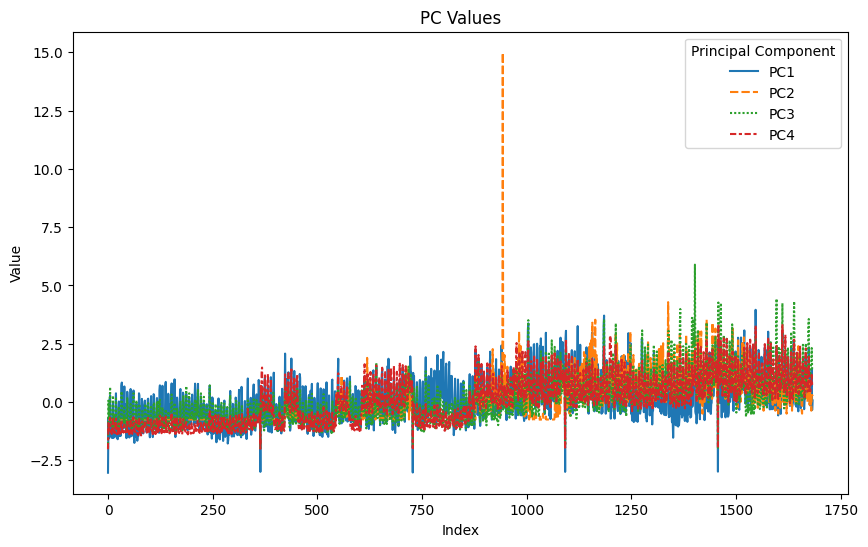

In [86]:
plt.figure(figsize=(10, 6))
sns.lineplot(data=scaled_df)
plt.xlabel('Index')
plt.ylabel('Value')
plt.title('PC Values')
plt.legend(title='Principal Component')
plt.show()

In [85]:
df_daily_sales_by_family['date'] = pd.to_datetime(df_daily_sales_by_family['date'])
#use rolling avg for SARIMA
df_daily_sales_by_family['rolling_average_7_day'] = df_daily_sales_by_family['sales'].rolling(window=7).mean() 

# #Set index to be date
# df_daily_sales_by_family.set_index('date', inplace=True)
# df_daily_sales_by_family.sort_index(inplace=True)

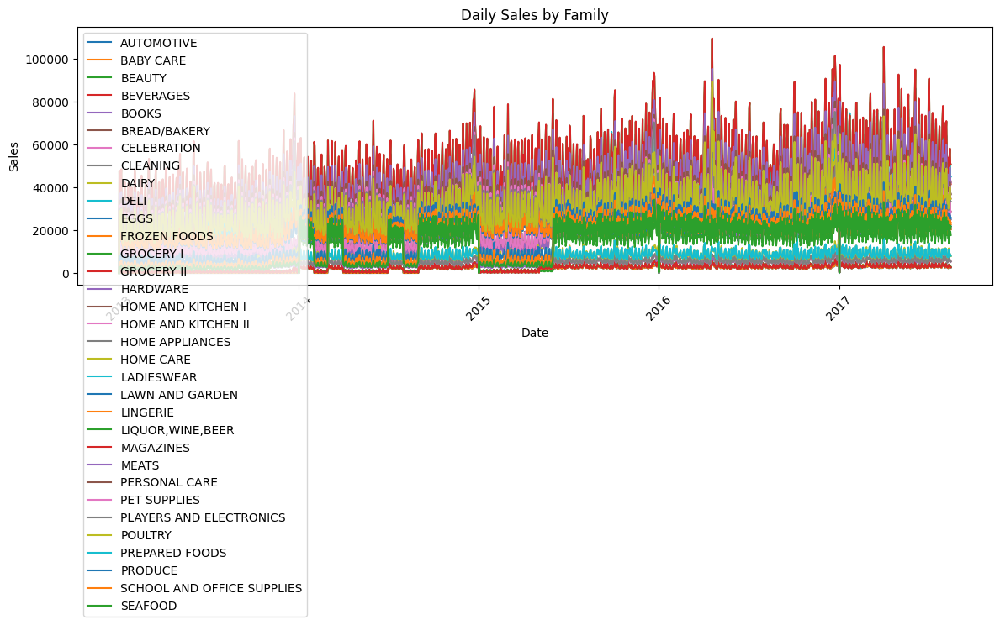

In [86]:
# Create a separate plot for each family
fig, ax = plt.subplots(figsize=(12, 6))

# Group the DataFrame by 'family' and iterate through each group to plot
for family, data in df_daily_sales_by_family.groupby('family'):
    ax.plot(data['date'], data['rolling_average_7_day'], label=family)

# Set labels and title
ax.set_xlabel('Date')
ax.set_ylabel('Sales')
ax.set_title('Daily Sales by Family')
ax.legend()  # Add legend to differentiate between different families

# Rotate x-axis labels for better readability
plt.xticks(rotation=45)

plt.tight_layout()
plt.show()

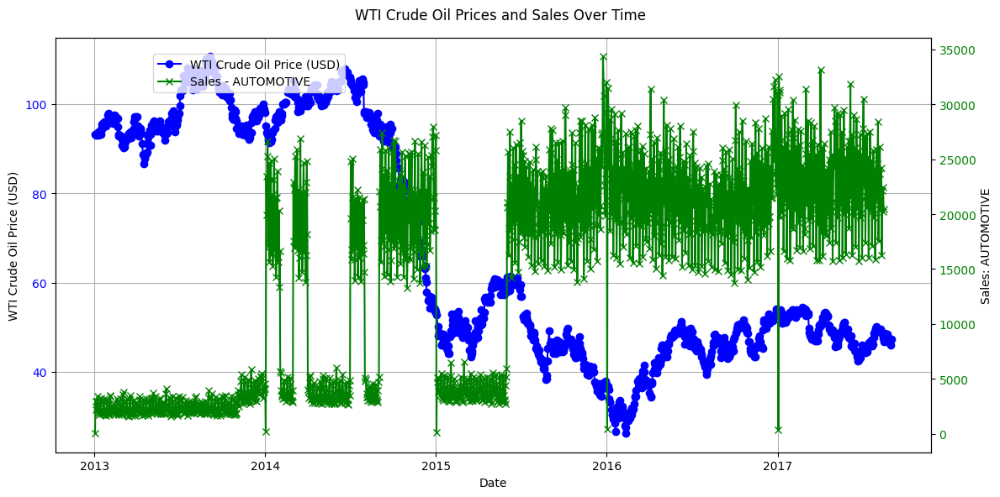

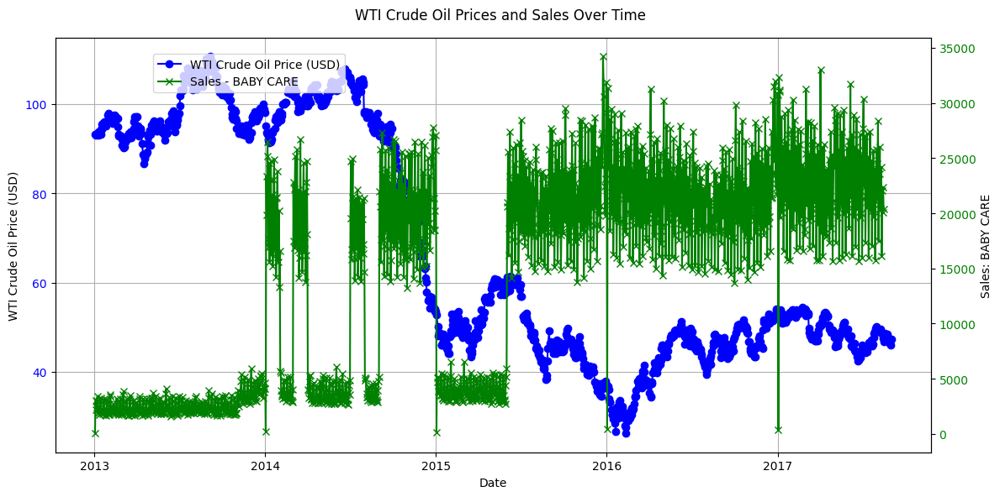

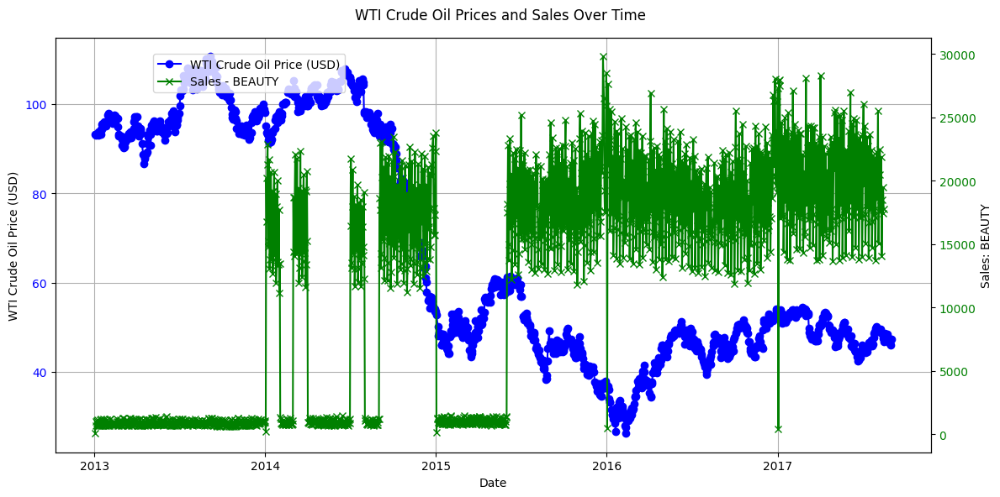

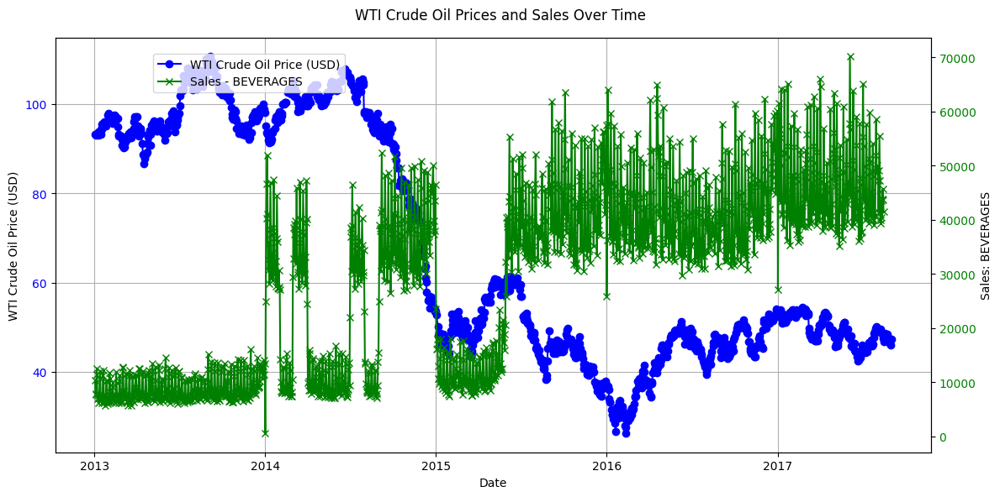

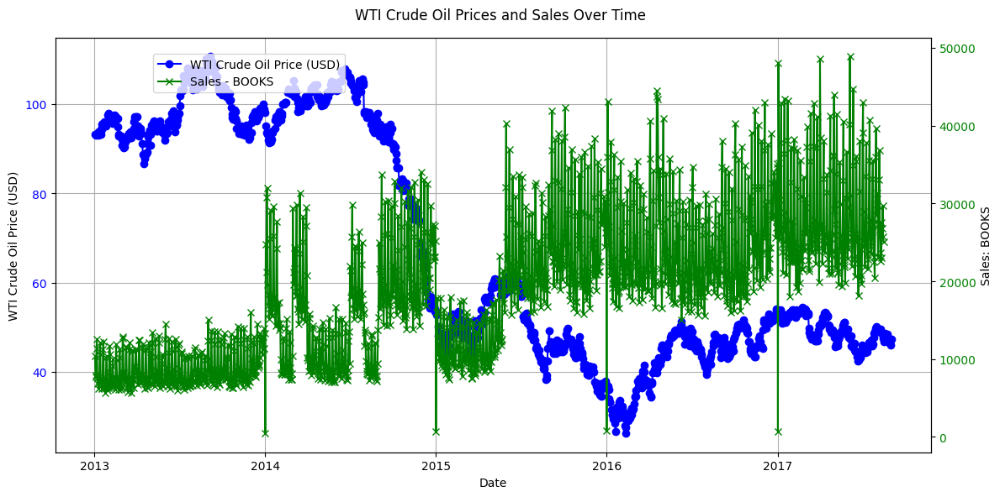

...

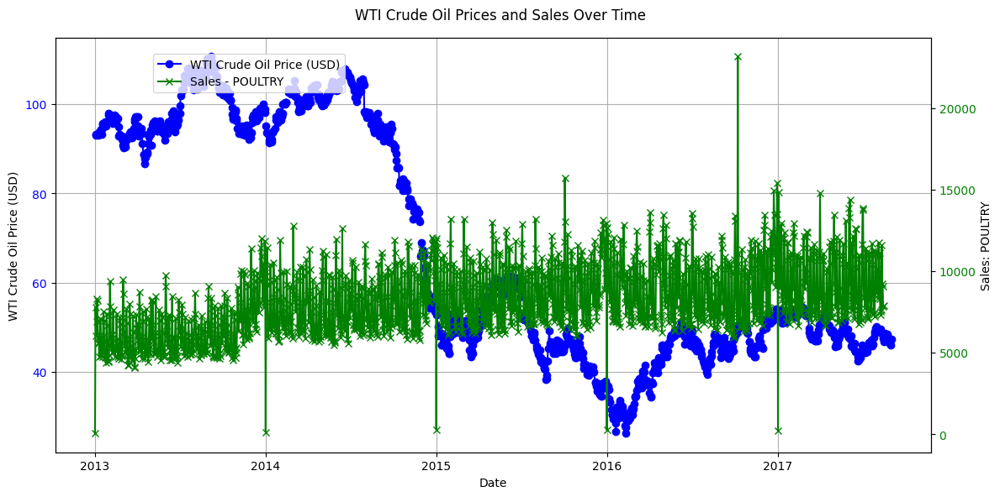

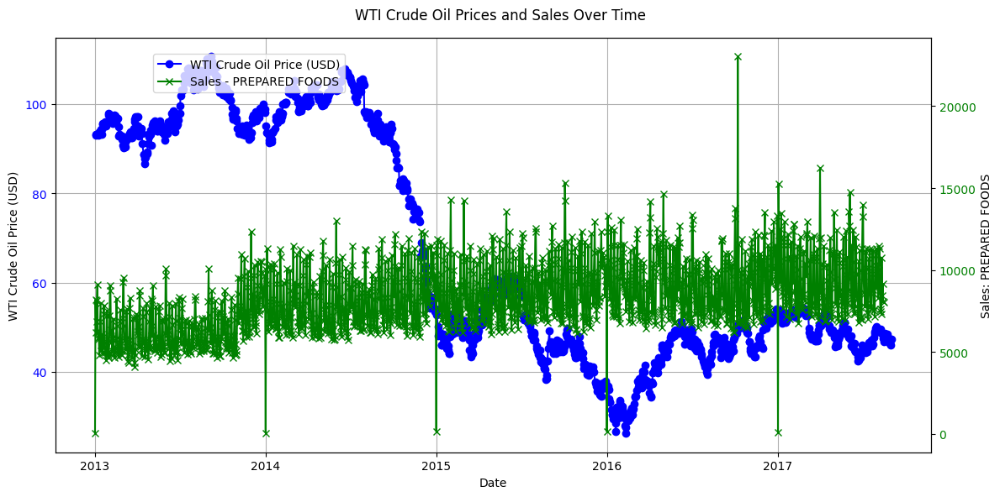

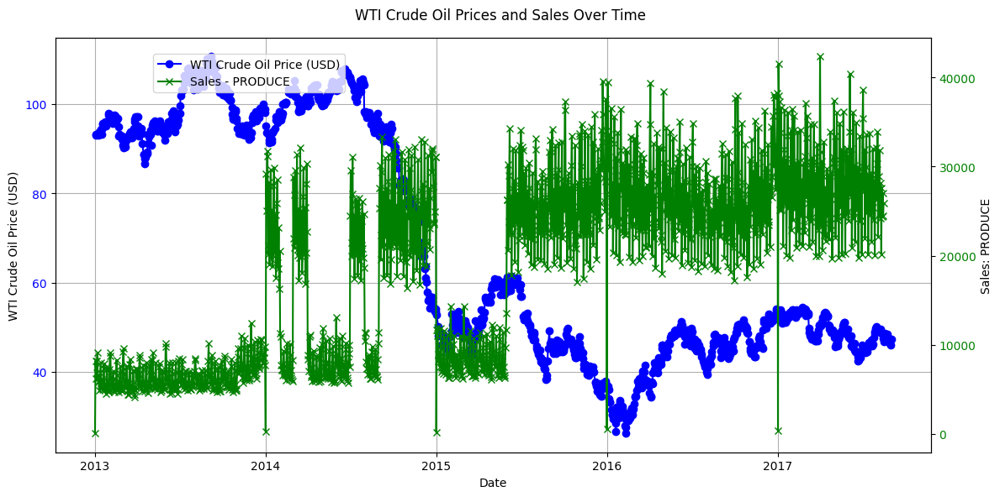

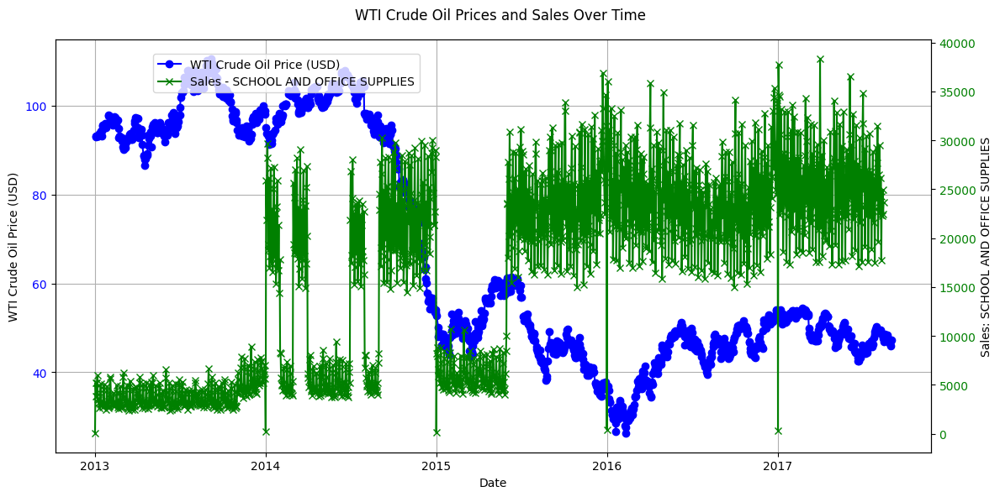

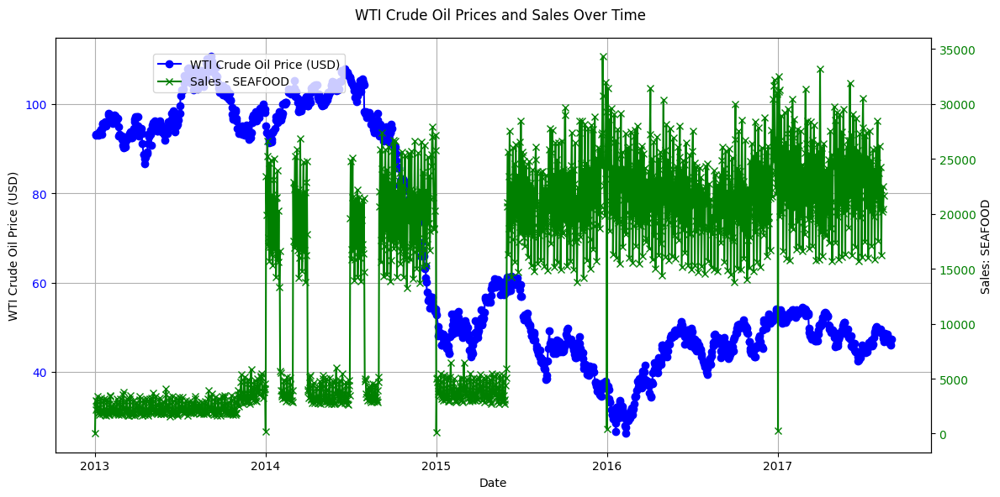

In [96]:
# Assuming you have df_oil and df_daily_sales_by_family DataFrames
for i in df_daily_sales_by_family['family'].unique():
    # Create a figure and axis objects
    fig, ax1 = plt.subplots(figsize=(12, 6))

    # Plot WTI Crude Oil prices
    ax1.plot(df_oil.index, df_oil['dcoilwtico'], color='blue', marker='o', linestyle='-', label='WTI Crude Oil Price (USD)')
    ax1.set_xlabel('Date')
    ax1.set_ylabel('WTI Crude Oil Price (USD)')
    ax1.tick_params(axis='y', labelcolor='blue')
    ax1.grid(True)

    # Create a twin axis sharing the same x-axis
    ax2 = ax1.twinx()

    # Choose the family you want to compare
    family_to_compare = i  # Specify the family name you want to compare

    # Filter sales data for the chosen family
    df_sales_family = df_daily_sales_by_family[df_daily_sales_by_family['family'] == family_to_compare]

    # Plot sales data for the chosen family
    ax2.plot(df_sales_family['date'], df_sales_family['rolling_average_7_day'], color='green', marker='x', linestyle='-', label=f'Sales - {family_to_compare}')
    ax2.set_ylabel('Sales: ' + family_to_compare)
    ax2.tick_params(axis='y', labelcolor='green')

    # Title and legend
    fig.suptitle('WTI Crude Oil Prices and Sales Over Time')
    fig.legend(loc="upper left", bbox_to_anchor=(0.15, 0.9))

    plt.xticks(rotation=45)
    plt.tight_layout()
    plt.show()


In [64]:
df_train[df_train['family'] == 'PRODUCE']

,id,date,store_nbr,family,sales,onpromotion,promoted
30,30,2013-01-01,1,PRODUCE,0.000,0,False
63,63,2013-01-01,10,PRODUCE,0.000,0,False
96,96,2013-01-01,11,PRODUCE,0.000,0,False
129,129,2013-01-01,12,PRODUCE,0.000,0,False
162,162,2013-01-01,13,PRODUCE,0.000,0,False
...,...,...,...,...,...,...,...
3000753,3000753,2017-08-15,54,PRODUCE,915.371,76,True
3000786,3000786,2017-08-15,6,PRODUCE,2073.636,5,True
3000819,3000819,2017-08-15,7,PRODUCE,5113.961,6,True
3000852,3000852,2017-08-15,8,PRODUCE,3939.392,10,True


# Holidays

In [104]:
# Convert the 'date' column to datetime type
df_holidays['date'] = pd.to_datetime(df_holidays['date'])

# Extract the year from the 'date' column
df_holidays['year'] = df_holidays['date'].dt.year

# Group by 'year' and count the number of holidays in each year
holiday_counts_per_year = df_holidays.groupby('year').size()

print(holiday_counts_per_year)

year
2012    41
2013    51
2014    67
2015    52
2016    86
2017    53
dtype: int64


# General Exploratory

In [31]:
df_train['family'].count()

3000888

1     55572
46    55572
36    55572
37    55572
38    55572
39    55572
4     55572
40    55572
41    55572
42    55572
43    55572
44    55572
45    55572
47    55572
10    55572
48    55572
49    55572
5     55572
50    55572
51    55572
52    55572
53    55572
54    55572
6     55572
7     55572
8     55572
35    55572
34    55572
33    55572
32    55572
11    55572
12    55572
13    55572
14    55572
15    55572
16    55572
17    55572
18    55572
19    55572
2     55572
20    55572
21    55572
22    55572
23    55572
24    55572
25    55572
26    55572
27    55572
28    55572
29    55572
3     55572
30    55572
31    55572
9     55572
Name: store_nbr, dtype: int64


<AxesSubplot: xlabel='family', ylabel='count'>

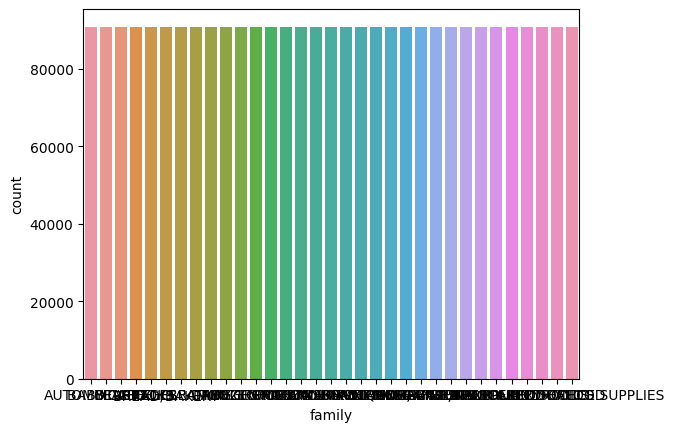

In [35]:
# Most sold products
print(df_train['store_nbr'].value_counts())
sns.countplot(x='family', data=df_train)

# Clean Data

In [66]:
df_train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3000888 entries, 0 to 3000887
Data columns (total 6 columns):
 #   Column       Dtype  
---  ------       -----  
 0   id           int64  
 1   date         object 
 2   store_nbr    int64  
 3   family       object 
 4   sales        float64
 5   onpromotion  int64  
dtypes: float64(1), int64(3), object(2)
memory usage: 137.4+ MB


In [67]:
print('max:',df_train['date'].max(), 'min:',df_train['date'].min())

max: 2017-08-15 min: 2013-01-01


In [14]:
df_train['date'] = pd.to_datetime(df_train['date'])

In [15]:
#add time element features
df_train['day'] = df_train['date'].dt.day
df_train['day_of_week'] = df_train['date'].dt.dayofweek
df_train['day_name'] = df_train['date'].dt.day_name()
df_train['week'] = df_train['date'].dt.isocalendar().week
df_train['month'] = df_train['date'].dt.month
df_train['year'] = df_train['date'].dt.year


## Check for seasonality

In [122]:
df_daily_sales = df_train.groupby('date')['sales'].sum().reset_index()
df_monthly_sales = df_train.groupby(['year','month'])['sales'].sum().reset_index()
df_monthly_sales_by_store = df_train.groupby(['year','month', 'store_nbr'])['sales'].sum().reset_index()

In [ ]:
#use rolling avg for SARIMA
df_daily_sales['rolling_average_7_day'] = df_daily_sales['sales'].rolling(window=7).mean() 

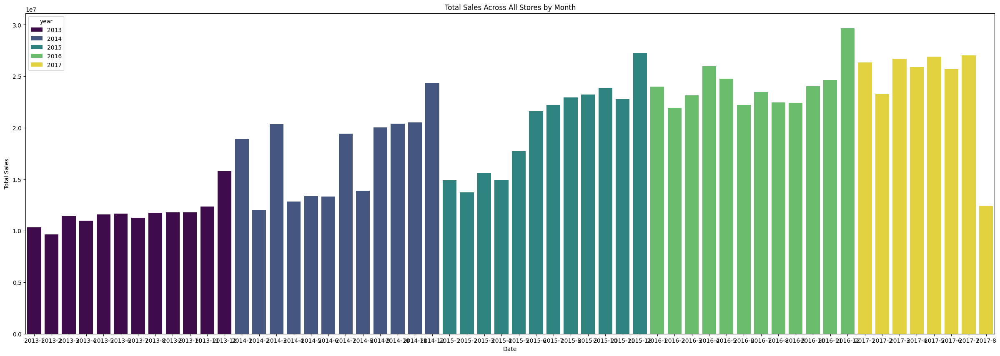

In [108]:
plt.figure(figsize=(30, 10))
#plt.plot(df_monthly_sales['year'].astype(str)+'-'+df_monthly_sales['month'].astype(str) , df_monthly_sales['sales'], marker='o', color='year')
sns.barplot(x=df_monthly_sales['year'].astype(str)+'-'+df_monthly_sales['month'].astype(str), y='sales', hue='year', data=df_monthly_sales, palette='viridis')
plt.xlabel('Date')
plt.ylabel('Total Sales')
plt.title('Total Sales Across All Stores by Month')
plt.show()

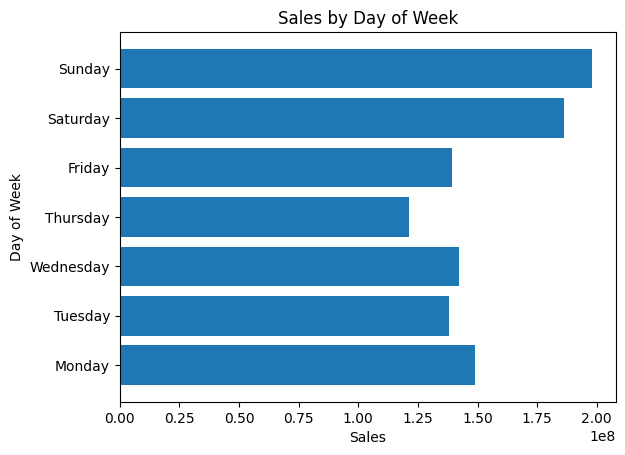

In [99]:
dow_sales = df_train.groupby('day_name')['sales'].sum().reset_index()
day_order = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']

dow_sales['day_name'] = pd.Categorical(dow_sales['day_name'], categories=day_order, ordered=True)
dow_sales.sort_values('day_name', inplace=True)

plt.barh(dow_sales['day_name'], dow_sales['sales'])
plt.xlabel('Sales')
plt.ylabel('Day of Week')
plt.title('Sales by Day of Week')
plt.show()

### there is significant seasonality across days of the week and months in the year. Ex. Sunday and December both usually will have high sales

## check for missing values

In [ ]:
### there are stores that werent open in 2013. it would be better to remove those rows

In [132]:
mindate = df_train[df_train['date']=='2013-01-01']
maxdate = df_train[df_train['date']=='2017-08-15']

print(mindate.shape[0], 'rows in the lowest date. ', maxdate.shape[0], 'rows in the max date')

1782 rows in the lowest date.  1782 rows in the max date


In [140]:
rows_per_day = df.groupby('date').size()
rows_per_day[rows_per_day!= 1782]

Series([], dtype: int64)

###  Every day has 1782 entries. That means that there are no missing values for id, store_nbr, or family. If there were no sales, the row will contain a 0 sales value

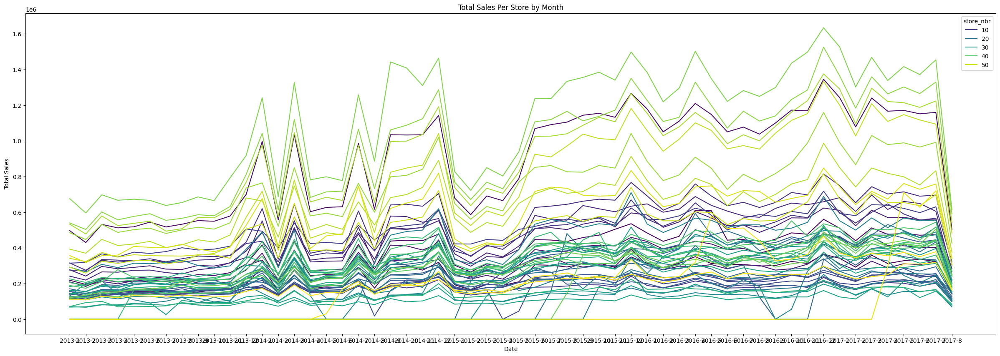

In [124]:
plt.figure(figsize=(30, 10))
#plt.plot(df_monthly_sales['year'].astype(str)+'-'+df_monthly_sales['month'].astype(str) , df_monthly_sales['sales'], marker='o', color='year')
sns.lineplot(x=df_monthly_sales_by_store['year'].astype(str)+'-'+df_monthly_sales_by_store['month'].astype(str), y='sales', hue='store_nbr', data=df_monthly_sales_by_store, palette='viridis')
plt.xlabel('Date')
plt.ylabel('Total Sales')
plt.title('Total Sales Per Store by Month')
plt.show()

In [ ]:
#check for stores and categories with 0 sales. remove those rows. 
#certain stores wont have opened in 2013 and certain store probably dont sell certain items?? bad assumption?
df_train.head()
unique_stores = df_train['store_nbr'].drop_duplicates().sort_values()
unique_stores.count()

In [146]:
first_sale_date_per_store = df_train[df_train['sales'] > 0].groupby('store_nbr')['date'].min().reset_index()
first_sale_date_per_store

,store_nbr,date
0,1,2013-01-02
1,2,2013-01-02
2,3,2013-01-02
3,4,2013-01-02
4,5,2013-01-02
5,6,2013-01-02
6,7,2013-01-02
7,8,2013-01-02
8,9,2013-01-02
9,10,2013-01-02


In [152]:
df_train_min_date = pd.merge(df_train, first_sale_date_per_store, on='store_nbr')
df_train_shortened = df_train_min_date[df_train_min_date['date_x'] >= df_train_min_date['date_y']] 
df_train_shortened

,id,date_x,store_nbr,family,sales,onpromotion,month,year,day,week,day_of_week,day_name,date_y
33,1782,2013-01-02,1,AUTOMOTIVE,2.000,0,1,2013,2,1,2,Wednesday,2013-01-02
34,1783,2013-01-02,1,BABY CARE,0.000,0,1,2013,2,1,2,Wednesday,2013-01-02
35,1784,2013-01-02,1,BEAUTY,2.000,0,1,2013,2,1,2,Wednesday,2013-01-02
36,1785,2013-01-02,1,BEVERAGES,1091.000,0,1,2013,2,1,2,Wednesday,2013-01-02
37,1786,2013-01-02,1,BOOKS,0.000,0,1,2013,2,1,2,Wednesday,2013-01-02
...,...,...,...,...,...,...,...,...,...,...,...,...,...
3000883,3000883,2017-08-15,9,POULTRY,438.133,0,8,2017,15,33,1,Tuesday,2013-01-02
3000884,3000884,2017-08-15,9,PREPARED FOODS,154.553,1,8,2017,15,33,1,Tuesday,2013-01-02
3000885,3000885,2017-08-15,9,PRODUCE,2419.729,148,8,2017,15,33,1,Tuesday,2013-01-02
3000886,3000886,2017-08-15,9,SCHOOL AND OFFICE SUPPLIES,121.000,8,8,2017,15,33,1,Tuesday,2013-01-02
